# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!pip install chart_studio

     |████████████████████████████████| 71kB 5.2MB/s 


In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
import chart_studio.plotly as py
import plotly.graph_objs as go
from collections import Counter

## 1.1 Reading Data

In [0]:
project_data = pd.read_csv('/content/drive/My Drive/Assignments_DonorsChoose_2018/train_data.csv')
resource_data = pd.read_csv('/content/drive/My Drive/Assignments_DonorsChoose_2018/resources.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [0]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]


project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Math & Science,"Applied Sciences, Health & Life Science",Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Special Needs,Special Needs,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1


In [0]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3 Text preprocessing

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [0]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay
55660,8393,p205479,2bf07ba08945e5d8b2a3f269b2b3cfe5,Mrs.,CA,2016-04-27 00:27:36,Grades PreK-2,Engineering STEAM into the Primary Classroom,I have been fortunate enough to use the Fairy ...,My students come from a variety of backgrounds...,Each month I try to do several science or STEM...,It is challenging to develop high quality scie...,My students need STEM kits to learn critical s...,53,1,Math_Science,AppliedSciences Health_LifeScience,I have been fortunate enough to use the Fairy ...
76127,37728,p043609,3f60494c61921b3b43ab61bdde2904df,Ms.,UT,2016-04-27 00:31:25,Grades 3-5,Sensory Tools for Focus,Imagine being 8-9 years old. You're in your th...,"Most of my students have autism, anxiety, anot...",It is tough to do more than one thing at a tim...,When my students are able to calm themselves d...,My students need Boogie Boards for quiet senso...,4,1,SpecialNeeds,SpecialNeeds,Imagine being 8-9 years old. You're in your th...


In [0]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)
print(project_data['essay'].values[99999])
print("="*50)

I have been fortunate enough to use the Fairy Tale STEM kits in my classroom as well as the STEM journals, which my students really enjoyed.  I would love to implement more of the Lakeshore STEM kits in my classroom for the next school year as they provide excellent and engaging STEM lessons.My students come from a variety of backgrounds, including language and socioeconomic status.  Many of them don't have a lot of experience in science and engineering and these kits give me the materials to provide these exciting opportunities for my students.Each month I try to do several science or STEM/STEAM projects.  I would use the kits and robot to help guide my science instruction in engaging and meaningful ways.  I can adapt the kits to my current language arts pacing guide where we already teach some of the material in the kits like tall tales (Paul Bunyan) or Johnny Appleseed.  The following units will be taught in the next school year where I will implement these kits: magnets, motion, si

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

\"A person is a person, no matter how small.\" (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed. \r\nStudents in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.\r\nOur school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the ear

In [0]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

 A person is a person, no matter how small.  (Dr.Seuss) I teach the smallest students with the biggest enthusiasm for learning. My students learn in many different ways using all of our senses and multiple intelligences. I use a wide range of techniques to help all my students succeed.   Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures, including Native Americans.  Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom. Kindergarteners in my class love to work with hands-on materials and have many different opportunities to practice a skill before it is mastered. Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum.Montana is the perfect place to learn about agriculture and nutrition. My students love to role play in our pretend kitchen in the early chi

In [0]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

 A person is a person no matter how small Dr Seuss I teach the smallest students with the biggest enthusiasm for learning My students learn in many different ways using all of our senses and multiple intelligences I use a wide range of techniques to help all my students succeed Students in my class come from a variety of different backgrounds which makes for wonderful sharing of experiences and cultures including Native Americans Our school is a caring community of successful learners which can be seen through collaborative student project based learning in and out of the classroom Kindergarteners in my class love to work with hands on materials and have many different opportunities to practice a skill before it is mastered Having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum Montana is the perfect place to learn about agriculture and nutrition My students love to role play in our pretend kitchen in the early childhood classroom

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 109248/109248 [00:56<00:00, 1921.05it/s]


In [0]:
preprocessed_essay_count= pd.DataFrame(preprocessed_essays)
project_data['essay_count'] = preprocessed_essay_count[0].str.count(' ')

In [0]:
def preprocessing(x,y):
    from tqdm import tqdm
    import math
    from collections import Counter
    preprocessed_essays = []
    my_count = Counter()
    a=[]
    # tqdm is for printing the status bar
    for sentance in tqdm(x[y].values):
        if sentance!=0:
            sent = decontracted(sentance)
            sent = sent.replace('\\r', ' ')
            sent = sent.replace('\\"', ' ')
            sent = sent.replace('\\n', ' ')
            sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
            # https://gist.github.com/sebleier/554280
            sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
            preprocessed_essays.append(sent.lower().strip())
        else:
            preprocessed_essays.append(0)
    return preprocessed_essays

In [0]:
preprocessed_essay1= preprocessing( project_data,"project_essay_1")
preprocessed_essay1= pd.DataFrame(preprocessed_essay1)

100%|██████████| 109248/109248 [00:25<00:00, 4318.75it/s]


In [0]:
preprocessed_essay2= preprocessing( project_data,"project_essay_2")
preprocessed_essay2= pd.DataFrame(preprocessed_essay2)

100%|██████████| 109248/109248 [00:31<00:00, 3472.78it/s]


In [0]:
project_data["project_essay_3"].fillna(0, inplace=True)

preprocessed_essay3= preprocessing( project_data, "project_essay_3")
preprocessed_essay3= pd.DataFrame(preprocessed_essay3)

100%|██████████| 109248/109248 [00:00<00:00, 139727.89it/s]


In [0]:
project_data["project_essay_4"].fillna(0, inplace=True)
preprocessed_essay4= preprocessing( project_data,"project_essay_4")
preprocessed_essay4= pd.DataFrame(preprocessed_essay4)

100%|██████████| 109248/109248 [00:00<00:00, 201795.44it/s]


In [0]:
project_data['essay1'] = preprocessed_essay1[0].str.count(' ')
project_data['essay2'] = preprocessed_essay2[0].str.count(' ')
project_data['essay3'] = preprocessed_essay3[0].str.count(' ')
project_data['essay4'] = preprocessed_essay4[0].str.count(' ')

In [0]:
# after preprocesing
len(preprocessed_essays)

109248

<h2><font color='black'> 1.4 Preprocessing of `project_title`</font></h2>




In [0]:
# similarly you can preprocess the titles also
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_title'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_titles.append(sent.lower().strip())
preprocessed_titles[2]

100%|██████████| 109248/109248 [00:02<00:00, 46416.82it/s]


'mobile learning mobile listening center'

In [0]:
preprocessed_titlec= pd.DataFrame(preprocessed_titles)
project_data['title_count'] = preprocessed_titlec[0].str.count(' ')

### resource summary

In [0]:
from tqdm import tqdm
preprocessed_summary = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['project_resource_summary'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_summary.append(sent.lower().strip())
preprocessed_summary[2]

100%|██████████| 109248/109248 [00:05<00:00, 19470.14it/s]


'students need mobile listening center able enhance learning'

## 1.5 Preparing data for models

In [0]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'essay_count',
       'essay1', 'essay2', 'essay3', 'essay4', 'title_count'],
      dtype='object')

we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - text : text data
       - project_resource_summary: text data (optinal)
       
       - quantity : numerical (optinal)
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

### 1.5.1 Vectorizing Categorical data

#### 1.5.2.3 Using Pretrained Models: Avg W2V

In [0]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('/content/drive/My Drive/Assignments_DonorsChoose_2018/glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

### 1.5.3 Vectorizing Numerical features

In [0]:
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
# check this one: https://www.youtube.com/watch?v=0HOqOcln3Z4&t=530s
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
from sklearn.preprocessing import StandardScaler

# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise the error
# ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
# Reshape your data either using array.reshape(-1, 1)

price_scalar = StandardScaler()
price_scalar.fit(project_data['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")

# Now standardize the data with above maen and variance.
price_standardized = price_scalar.transform(project_data['price'].values.reshape(-1, 1))

Mean : 298.1193425966608, Standard deviation : 367.49634838483496


In [0]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [0]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

for_sentiment = 'a person is a person no matter how small dr seuss i teach the smallest students with the biggest enthusiasm \
for learning my students learn in many different ways using all of our senses and multiple intelligences i use a wide range\
of techniques to help all my students succeed students in my class come from a variety of different backgrounds which makes\
for wonderful sharing of experiences and cultures including native americans our school is a caring community of successful \
learners which can be seen through collaborative student project based learning in and out of the classroom kindergarteners \
in my class love to work with hands on materials and have many different opportunities to practice a skill before it is\
mastered having the social skills to work cooperatively with friends is a crucial aspect of the kindergarten curriculum\
montana is the perfect place to learn about agriculture and nutrition my students love to role play in our pretend kitchen\
in the early childhood classroom i have had several kids ask me can we try cooking with real food i will take their idea \
and create common core cooking lessons where we learn important math and writing concepts while cooking delicious healthy \
food for snack time my students will have a grounded appreciation for the work that went into making the food and knowledge \
of where the ingredients came from as well as how it is healthy for their bodies this project would expand our learning of \
nutrition and agricultural cooking recipes by having us peel our own apples to make homemade applesauce make our own bread \
and mix up healthy plants from our classroom garden in the spring we will also create our own cookbooks to be printed and \
shared with families students will gain math and literature skills as well as a life long enjoyment for healthy cooking \
nannan'
negative=[]
neutral=[]
positive=[]
compound=[]
#ss = sid.polarity_scores(for_sentiment)
for i in range(0, len(preprocessed_essays)):
    a=sid.polarity_scores(preprocessed_essays[i])
    negative.append(a["neg"])
    neutral.append(a["neu"])
    positive.append(a["pos"])
    compound.append(a["compound"])

print(len(negative))
print(len(neutral))
print(len(positive))
print(len(compound))
    


#for k in ss:
#    print('{0}: {1}, '.format(k, ss[k]), end='')
#print(ss["neg"])
# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

109248
109248
109248
109248


<h1>2. Clustering

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [0]:
#prepare a dataframe  
print(project_data.columns)
#print(project_data["Date"].head(10))
#must inlcude categories,subcategories, preprocessed essay,preprocessed title,state,grade and prefix
print("="*70)
important_data= project_data[['teacher_number_of_previously_posted_projects','teacher_prefix', 'school_state','Date', 'project_grade_category','project_is_approved','clean_categories', 'clean_subcategories','price']].copy()
#include preprocessed titles,essays
#important_data = important_data.sort_values(by = "Date")
#print(important_data["Date"].head(10))
important_data["teacher_prefix"].fillna("None", inplace = True)
important_data["processed_essays"]= preprocessed_essays
important_data["processed_titles"]= preprocessed_titles
important_data["processed_summary"]= preprocessed_summary
important_data['title_count']= project_data['title_count']
important_data["essay_count"]= project_data['essay_count']
#important_data["essay1"]= project_data['essay1']
#important_data["essay2"]= project_data['essay2']
#important_data["essay3"]= project_data['essay3']
#important_data["essay4"]= project_data['essay4']
#important_data["essay3"].fillna(0, inplace=True)
#important_data["essay4"].fillna(0, inplace=True)
#important_data["negative_score"]= negative 
#important_data["neutral_score"]= neutral
#important_data["positive_score"]= positive
#important_data["compound_score"]= compound
#important_data["new_price"]=
new_price=[]
for i in important_data.price:
    new_price.append(int(i))
important_data["new_price"]= new_price    

print(important_data.columns)
print("="*70)
print("shape of new data is: ",important_data.shape)
#important_data.project_is_approved = important_data.project_is_approved.map({0.0: -1, 1.0: 1})


Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'Date', 'project_grade_category', 'project_title', 'project_essay_1',
       'project_essay_2', 'project_essay_3', 'project_essay_4',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'essay', 'essay_count',
       'essay1', 'essay2', 'essay3', 'essay4', 'title_count', 'price',
       'quantity'],
      dtype='object')
Index(['teacher_number_of_previously_posted_projects', 'teacher_prefix',
       'school_state', 'Date', 'project_grade_category', 'project_is_approved',
       'clean_categories', 'clean_subcategories', 'price', 'processed_essays',
       'processed_titles', 'processed_summary', 'title_count', 'essay_count',
       'new_price'],
      dtype='object')
shape of new data is:  (109248, 15)


In [0]:
#data_approved = important_data[important_data["project_is_approved"] == 1.0].sample(n = 16000)
#data_rejected = important_data[important_data["project_is_approved"] == 0.0].sample(n = 16000)
#final_data = pd.concat([data_approved, data_rejected])
#final_data = final_data.sort_values(by ="Date")
#important_data= final_data


In [0]:
#splitting data into train test and cv
#https://stackoverflow.com/questions/24147278/how-do-i-create-test-and-train-samples-from-one-dataframe-with-pandas
from sklearn.model_selection import train_test_split
train_data1, data_test= train_test_split(important_data, test_size=0.38, random_state=0)#splitting data into train and test
data_train, data_cv= train_test_split(train_data1, test_size= 0.26, random_state=0)
Y_train= data_train["project_is_approved"].values.reshape(-1,1)
Y_test=  data_test["project_is_approved"].values.reshape(-1,1)
Y_cv=  data_cv["project_is_approved"].values.reshape(-1,1)


In [0]:
print("the shape of train data is: ",data_train.shape) 
print("the shape of test data is: ",data_test.shape)
print("the shape of cv data is: ",data_cv.shape)
#data_test["new_price"][1:10]


the shape of train data is:  (50122, 15)
the shape of test data is:  (41515, 15)
the shape of cv data is:  (17611, 15)


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features, essays and titles</h2>

In [0]:
def data_modelling(y,x,z,u):#function for vectorizing numerical,categorical data along with essays and titles
    %matplotlib inline
    import warnings
    warnings.filterwarnings("ignore")

    import sqlite3
    import pandas as pd
    import numpy as np
    import nltk
    import string
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.feature_extraction.text import TfidfTransformer
    from sklearn.feature_extraction.text import TfidfVectorizer

    from sklearn.feature_extraction.text import CountVectorizer
    from sklearn.metrics import confusion_matrix
    from sklearn import metrics
    from sklearn.metrics import roc_curve, auc
    from nltk.stem.porter import PorterStemmer

    import re
    # Tutorial about Python regular expressions: https://pymotw.com/2/re/
    import string
    from nltk.corpus import stopwords
    from nltk.stem import PorterStemmer
    from nltk.stem.wordnet import WordNetLemmatizer

    from gensim.models import Word2Vec
    from gensim.models import KeyedVectors
    import pickle

    from tqdm import tqdm
    import os
    import chart_studio.plotly as py
    import plotly.graph_objs as go
    from collections import Counter
    
    #state encoding
    from collections import Counter
    my_count = Counter()
    for wor in x['school_state'].values:
        my_count.update(wor.split())
    cat_dicti = dict(my_count)
    #print(my_count)
    sorted_cat_dicti = dict(sorted(cat_dicti.items(), key=lambda kv: kv[1]))

    vectorize = CountVectorizer(vocabulary=list(sorted_cat_dicti.keys()), lowercase=False, binary=True)
    vectorize.fit(x['school_state'].values)
    a1= vectorize.get_feature_names()

    categories_state = vectorize.transform(x['school_state'].values)
    categories_state1 = vectorize.transform(z['school_state'].values)
    categories_state2 = vectorize.transform(u['school_state'].values)
    #print("Shape of matrix after one hot encodig ",categories_state.shape)
    #print("="*50)
    ##############

    #teacher_prefix encoding
    from tqdm import tqdm
    import string
    
    #https://www.geeksforgeeks.org/python-pandas-dataframe-fillna-to-replace-null-values-in-dataframe/
    my_coun = Counter()
    for wo in x.teacher_prefix.values:
        my_coun.update(wo.split())
    cat_dictio = dict(my_coun)
    sorted_cat_dictio = dict(sorted(cat_dictio.items(), key=lambda kv: kv[1]))

    vectoriz = CountVectorizer(vocabulary=list(sorted_cat_dictio.keys()), lowercase=False, binary=True)
    vectoriz.fit(x['teacher_prefix'].values)
    a2= vectoriz.get_feature_names()#print(vectoriz.get_feature_names())
    categories_prefix = vectoriz.transform(x['teacher_prefix'].values)
    categories_prefix1 = vectoriz.transform(z['teacher_prefix'].values)
    categories_prefix2 = vectoriz.transform(u['teacher_prefix'].values)
    #print("Shape of matrix after one hot encoding ",categories_prefix.shape)
    #print("="*50)


    #project grade category
    my_count = Counter()
    for w in x['project_grade_category'].values:
        my_count.update(w.split(","))
    cat_dic = dict(my_count)
    sorted_cat_dic = dict(sorted(cat_dic.items(), key=lambda kv: kv[1]))

    vector = CountVectorizer(vocabulary=list(sorted_cat_dic.keys()), lowercase=False, binary=True)
    vector.fit(x['project_grade_category'].values)
    a3= vector.get_feature_names()
    categories_grade= vector.transform(x['project_grade_category'].values)
    categories_grade1= vector.transform(z['project_grade_category'].values)
    categories_grade2= vector.transform(u['project_grade_category'].values)
    #print("Shape of matrix after one hot encoding ",categories_grade.shape)
    #print("="*50)


    #categories_encoding
    from collections import Counter
    my_counter = Counter()
    for word in x['clean_categories'].values:
        my_counter.update(word.split())

    cat_dict = dict(my_counter)
    sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))
    from sklearn.feature_extraction.text import CountVectorizer
    vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
    categories_one_hot= vectorizer.fit_transform(x['clean_categories'].values)
    categories_one_hot1= vectorizer.fit_transform(z['clean_categories'].values)
    categories_one_hot2= vectorizer.fit_transform(u['clean_categories'].values)
    a4= vectorizer.get_feature_names()
    #print("Shape of matrix after one hot encoding ",categories_one_hot.shape)
    #print("="*50)


    #sub_categories_encoding
    my_counter = Counter()
    for word in x['clean_subcategories'].values:
        my_counter.update(word.split())    
    sub_cat_dict = dict(my_counter)
    sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

    vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
    sub_categories_one_hot = vectorizer.fit_transform(x['clean_subcategories'].values)
    sub_categories_one_hot1 = vectorizer.fit_transform(z['clean_subcategories'].values)
    sub_categories_one_hot2 = vectorizer.fit_transform(u['clean_subcategories'].values)
    a5= vectorizer.get_feature_names()
    #rint("Shape of matrix after one hot encoding ",sub_categories_one_hot.shape)
    #print("="*50)

    #price_standardization
    from sklearn.preprocessing import StandardScaler

    # price_standardized = standardScalar.fit(project_data['price'].values)
    # this will rise the error
    # ValueError: Expected 2D array, got 1D array instead: array=[725.05 213.03 329.   ... 399.   287.73   5.5 ].
    # Reshape your data either using array.reshape(-1, 1)

    price_scalar = StandardScaler()
    price_scalar.fit(x['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
    price_standardized= price_scalar.transform(x['price'].values.reshape(-1, 1))
    price_standardized1= price_scalar.transform(z['price'].values.reshape(-1, 1))
    price_standardized2= price_scalar.transform(u['price'].values.reshape(-1, 1))
    #print("the shape of matrix for price is: ", price_standardized.shape)
    #print("="*50)
    a6= ["price"]
    #number_of_previously_posted_projects
    from sklearn.preprocessing import StandardScaler
    project_scalar = StandardScaler()
    project_scalar.fit(x['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
    project_standardized= project_scalar.transform(x['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
    project_standardized1= project_scalar.transform(z['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
    project_standardized2= project_scalar.transform(u['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1))
    a7= ["number_of_projects"]
    #print("the shape of matrix for price is: ", price_standardized.shape)
    #print("="*50)
    from scipy.sparse import hstack
    if y==0:
        from sklearn.preprocessing import StandardScaler
        from sklearn import decomposition
        #standarizing essay count
        essay_scalar= StandardScaler()
        essay_scalar.fit(x["essay_count"].values.reshape(-1, 1))
        essays= essay_scalar.transform(x["essay_count"].values.reshape(-1, 1))
        essays1= essay_scalar.transform(z["essay_count"].values.reshape(-1, 1))
        essays2= essay_scalar.transform(u["essay_count"].values.reshape(-1, 1))
        
        #standardizing title count
        title_scalar= StandardScaler()
        title_scalar.fit(x["title_count"].values.reshape(-1, 1))
        titles= title_scalar.transform(x["title_count"].values.reshape(-1, 1))
        titles1= title_scalar.transform(z["title_count"].values.reshape(-1, 1))
        titles2= title_scalar.transform(u["title_count"].values.reshape(-1, 1))
        
        vectorizer = TfidfVectorizer(min_df=45)
        vectorizer.fit(x.processed_essays)
        #a8= vectorizer.get_feature_names()
        A= vectorizer.transform(x.processed_essays)
        #print(A.shape)
        B= vectorizer.transform(z.processed_essays)
        C= vectorizer.transform(u.processed_essays)
        #print(A.shape)
        from sklearn.decomposition import TruncatedSVD
        svd= TruncatedSVD(n_components=1250, algorithm="randomized", n_iter=5)
        svd.fit(A)
        A1= svd.transform(A)
        A2= svd.transform(B)
        A3= svd.transform(C)
        #################################################
        # svd for dimensionality redcution (non-visualization)
        svd1= decomposition.TruncatedSVD()

        svd1.n_components = 7000
        svd_data = svd1.fit_transform(A)

        percentage_var_explained = svd1.explained_variance_ / np.sum(svd1.explained_variance_);

        cum_var_explained = np.cumsum(percentage_var_explained)

        # Plot the PCA spectrum
        plt.figure(1, figsize=(6, 4))

        plt.clf()
        plt.plot(cum_var_explained, linewidth=2)
        plt.axis('tight')
        plt.grid()
        plt.xlabel('n_components')
        plt.ylabel('Cumulative_explained_variance')
        plt.title("plot to find optimal number of n components")
        plt.show()     
        ####################################################
        from scipy.sparse import hstack
        X_model= hstack((project_standardized,categories_prefix,categories_state,categories_grade,categories_one_hot,sub_categories_one_hot,price_standardized,essays,titles, A1, x["compound_score"].values.reshape(-1,1), x["neutral_score"].values.reshape(-1,1), x["negative_score"].values.reshape(-1,1), x["positive_score"].values.reshape(-1,1)))
        Y_model= hstack((project_standardized1,categories_prefix1,categories_state1,categories_grade1,categories_one_hot1,sub_categories_one_hot1,price_standardized1,essays1,titles1, A2,z["compound_score"].values.reshape(-1,1), z["neutral_score"].values.reshape(-1,1), z["negative_score"].values.reshape(-1,1), z["positive_score"].values.reshape(-1,1)))
        Z_model= hstack((project_standardized2,categories_prefix2,categories_state2,categories_grade2,categories_one_hot2,sub_categories_one_hot2,price_standardized2,essays2,titles2, A3,u["compound_score"].values.reshape(-1,1), u["neutral_score"].values.reshape(-1,1), u["negative_score"].values.reshape(-1,1), u["positive_score"].values.reshape(-1,1)))
        
        #print("x model", X_model.shape)
        X_model= X_model.tocsr()
        Y_model= Y_model.tocsr()
        Z_model= Z_model.tocsr()
        afinal= a7+a2+a1+a3+a4+a5+a6+a8+a10+a9
        #X_model= X_model[:, :-2]
        #print(X_model.shape)
        return X_model,Y_model,Z_model
    if y==1:
        #project_essay 
        #bow
        vectorizer = CountVectorizer(min_df=20)
        vectorizer.fit(x.processed_essays)
        a8= vectorizer.get_feature_names()
        text_bow= vectorizer.transform(x.processed_essays)
        #print("The shape of essay words after applying BOW: ",text_bow.shape)
        A= text_bow
        #print("Shape of matrix after one hot encoding(BOW): ",text_bow.shape)
        #print("="*50)
        ###########
        #summary
        vectorizerc = CountVectorizer(min_df=20)
        vectorizerc.fit(x.processed_summary)
        a9= vectorizerc.get_feature_names()
        resource_bow= vectorizerc.transform(x.processed_summary)
        A1= resource_bow
        #project_title
        #bow
        vectorizers = CountVectorizer(min_df=20)
        vectorizers.fit(x.processed_titles)
        a10= vectorizers.get_feature_names()
        text_bowt= vectorizers.transform(x.processed_titles)
        B= text_bowt
        #print(B.shape)
        from scipy.sparse import hstack
        D=vectorizer.transform(z.processed_essays)
        A2= vectorizerc.transform(z.processed_summary)
        #print(D.shape)
        E=vectorizers.transform(z.processed_titles)
        #print(E.shape)
        #a_b= z  
        F=vectorizer.transform(u.processed_essays)
        G=vectorizers.transform(u.processed_titles)
        A3= vectorizerc.transform(u.processed_summary)
    
        print("All the features are encoded successfully and BOW is used! ")
        #print("="*50)
    from scipy.sparse import hstack
    X_model= hstack((project_standardized,categories_prefix,categories_state,categories_grade,categories_one_hot,sub_categories_one_hot,price_standardized,A,B,A1))
    Y_model= hstack((project_standardized1,categories_prefix1,categories_state1,categories_grade1,categories_one_hot1,sub_categories_one_hot1,price_standardized1,D,E,A2))
    Z_model= hstack((project_standardized2,categories_prefix2,categories_state2,categories_grade2,categories_one_hot2,sub_categories_one_hot2,price_standardized2,F,G,A3))
    #print("x model", X_model.shape)
    #afinal= a7+a2+a1+a3+a4+a5+a6+a8+a10+a9
    X_model= X_model.tocsr()
    Y_model= Y_model.tocsr()
    Z_model= Z_model.tocsr()
    #afinal= a7+a2+a1+a3+a4+a5+a6+a8+a10+a9
    #X_model= X_model[:, :-2]
    #print(X_model.shape)
    return X_model,Y_model,Z_model


In [0]:
def wordcloud(x):
    from wordcloud import WordCloud, STOPWORDS #https://www.geeksforgeeks.org/generating-word-cloud-python/ 
    import matplotlib.pyplot as plt 
    import pandas as pd
    comment_words = ' '
    comment_words1 = ''
    comment_words2 = ''
    comment_words3 = ''
    comment_words4 = ''
    comment_words5 = ''
    comment_words6 = ''
    comment_words7 = ''
    comment_words8 = ''
    comment_words9 = ''
    comment_words10 = ''
    comment_words11 = ''
    comment_words12= ''
    stopwords = set(STOPWORDS)
    count=0
     #iterate through the csv file 
    for val in tqdm(x):
        count= count+1

        # typecaste each val to string 
        val = str(val) 

        # split the value 
        tokens = val.split() 

        # Converts each token into lowercase 
        for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 

        for words in tokens:
            if count<1000:
                comment_words = comment_words + words + ' '
            if count>=1000 and count<2000:
                comment_words1= comment_words1+ words+ ' ' 
            if count>=2000 and count<3000:
                comment_words2= comment_words2+ words+ ' ' 
            if count>=3000 and count<4000:
                comment_words3= comment_words3+ words+ ' ' 
            if count>=4000 and count<5000:
                comment_words4= comment_words4+ words+ ' ' 
            if count>=5000 and count<6000:
                comment_words5= comment_words5+ words+ ' ' 
            if count>=6000 and count<7000:
                comment_words6= comment_words6+ words+ ' ' 
            if count>=7000 and count<8000:
                comment_words7= comment_words7+ words+ ' ' 
            if count>=8000 and count<9000:
                comment_words8= comment_words8+ words+ ' ' 
            if count>=9000 and count<10000:
                comment_words9= comment_words9+ words+ ' ' 
            if count>=10000 and count<11000:
                comment_words10= comment_words10+ words+ ' ' 
            if count>=11000 and count<12000:
                comment_words11= comment_words11+ words+ ' ' 
            if count>=12000 and count<=len(x):
                comment_words12= comment_words12+ words+ ' ' 

                
    comment_words= comment_words+comment_words1+comment_words2+comment_words3+comment_words4+comment_words5+comment_words6+comment_words7+comment_words8+comment_words9+comment_words10+comment_words11+comment_words12 
   
    
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords,  
                min_font_size = 10,
                relative_scaling=0.5).generate(comment_words) 
  
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
  
    plt.show()

In [0]:
def analysis(x,y):
    print("Analysis for CLUSTER {}".format(y))
    count=0
    wordcloud(x)

<h2>2.4 Dimensionality Reduction on the selected features </h2>

In [0]:
#emcoding data using data modelling function
x1_train, x1_test,x1_cv= data_modelling(1,data_train,data_test,data_cv)


from sklearn.feature_selection import SelectKBest, f_classif
c1= SelectKBest(f_classif, k=5000)
c1.fit(x1_train,Y_train)
X= c1.transform(x1_train)

print("The shape of data after encoding: ",X.shape)

All the features are encoded successfully and BOW is used! 
The shape of data after encoding:  (50122, 5000)


<h2>2.5 Apply Kmeans</h2>

100%|██████████| 10/10 [3:28:54<00:00, 1253.42s/it]


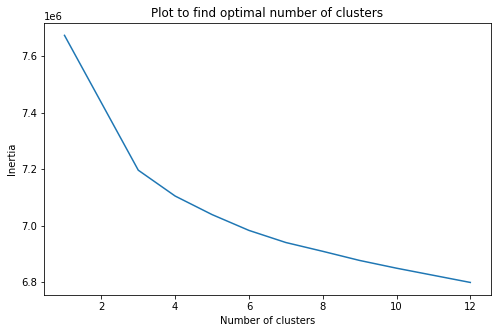

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_auc_score
from matplotlib import pylab
from tqdm import tqdm
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import KMeans
#from sklearn.calibration import CalibratedClassifierCV 
import math
import numpy as np
#x11_train=x
#y11_train= y
inertia = []
cv = []

#k1 = np.arange(0,2,0.0001)
number_of_clusters= [1,3,4,5,6,7,8,9,10,12]
#max_depths=[1,5,10,50,100,500]
#k3=[]
#for k in max_depths:
#    k3.append(math.log(k))
#for j in min_samples:
#    k2.append(math.log(j))
#    k3.append([math.log(j),j])
    #print(k3)    
for j in tqdm(number_of_clusters):
    neigh = KMeans(n_clusters=j, init="k-means++", n_init=3, max_iter=100, tol=0.0001, precompute_distances=True, verbose=0, random_state=1, copy_x=True, n_jobs=-1, algorithm="auto")
    neigh.fit(X)
    inertia.append(neigh.inertia_)
    
        
plt.figure(figsize=(8,5))   
plt.plot(number_of_clusters,inertia)
plt.title("Plot to find optimal number of clusters")
plt.xlabel("Number of clusters")
plt.ylabel("Inertia")
plt.show()


#### Observations
    1. We'v used k means clustering to find optimal number of clusters
    2. inertia is sum of squared distances of each sample to its nearest centroid.
    3. We can take our optimal k as 11.

In [0]:
from sklearn.cluster import KMeans
neigh = KMeans(n_clusters=11, init="k-means++", n_init=3, max_iter=100, tol=0.0001, precompute_distances=True, verbose=0, random_state=1, copy_x=True, n_jobs=-1, algorithm="auto")
neigh.fit(X)
c=neigh.labels_

In [0]:
data_train["labels"]=c
d= data_train.groupby("labels")
print("the size of cluster 1 is: ",d.get_group(0).shape)
print("the size of cluster 2 is: ",d.get_group(1).shape)
print("the size of cluster3 is: ",d.get_group(2).shape)
print("the size of cluster4 is: ",d.get_group(3).shape)
print("the size of cluster5 is: ",d.get_group(4).shape)
print("the size of cluster6 is: ",d.get_group(5).shape)
print("the size of cluster7 is: ",d.get_group(6).shape)
print("the size of cluster8 is: ",d.get_group(7).shape)
print("the size of cluster9 is: ",d.get_group(8).shape)
print("the size of cluster 10 is: ",d.get_group(9).shape)
print("the size of cluster 11 is: ",d.get_group(10).shape)
e1= d.get_group(0).processed_essays
e2= d.get_group(1).processed_essays
e3= d.get_group(2).processed_essays
e4= d.get_group(3).processed_essays
e5= d.get_group(4).processed_essays
e6= d.get_group(5).processed_essays
e7= d.get_group(6).processed_essays
e8= d.get_group(7).processed_essays
e9= d.get_group(8).processed_essays
e10= d.get_group(9).processed_essays
e11= d.get_group(10).processed_essays

the size of cluster 1 is:  (2336, 16)
the size of cluster 2 is:  (7360, 16)
the size of cluster3 is:  (12170, 16)
the size of cluster4 is:  (3608, 16)
the size of cluster5 is:  (1247, 16)
the size of cluster6 is:  (2941, 16)
the size of cluster7 is:  (2911, 16)
the size of cluster8 is:  (4952, 16)
the size of cluster9 is:  (1241, 16)
the size of cluster 10 is:  (3575, 16)
the size of cluster 11 is:  (7781, 16)


# Word Cloud

  0%|          | 0/2336 [00:00<?, ?it/s]

Analysis for CLUSTER 1


100%|██████████| 2336/2336 [00:14<00:00, 159.30it/s]


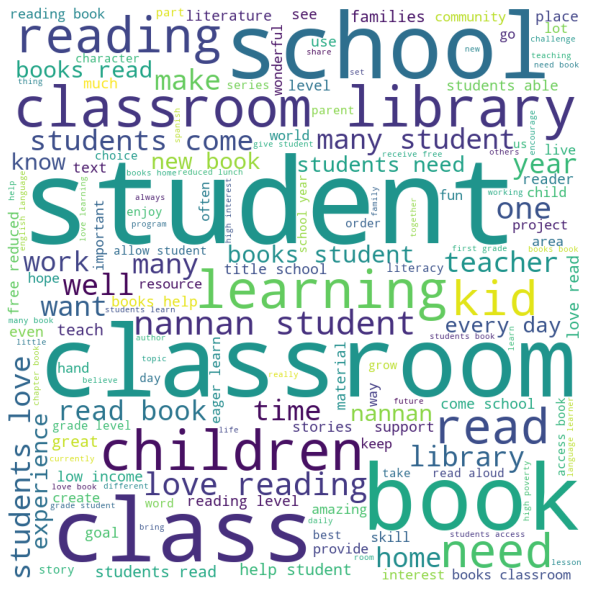

,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
17351,0,Ms.,PA,2016-07-24 10:46:32,Grades 3-5,1,Literacy_Language,Literacy,455.49,students walk classrooms every day full life r...,capturing meaning books listening center,students need listening center increase listen...,3,116,455,0
46329,11,Ms.,NV,2016-09-09 15:59:52,Grades 3-5,1,Literacy_Language,Literacy,12.26,typical day room starts smiles high fives sens...,brighter books,students need class sets novels read loud grow...,3,119,12,0
13629,0,Ms.,CO,2016-07-10 17:32:34,Grades 3-5,1,Literacy_Language,Literacy,310.44,not meet students yet know students low income...,welcome back library,students need books build classroom library wa...,3,162,310,0
102057,1,Mrs.,IN,2017-03-28 21:19:36,Grades 3-5,0,Literacy_Language,Literacy,168.25,work class high ability students come school e...,readers everywhere,students need sets book order complete author ...,6,157,168,0


Some datapoints from the cluster:


In [0]:
analysis(e1,1)
print("Some datapoints from the cluster:")
d.get_group(0)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like classroom library, student, and school appear a lot.
    2. We find some similarity in the datapoints of cluster 1 
    3. Categories and grade category appear to be the same.

  2%|▏         | 130/7360 [00:00<00:05, 1285.03it/s]

Analysis for CLUSTER 2


100%|██████████| 7360/7360 [01:12<00:00, 101.73it/s]


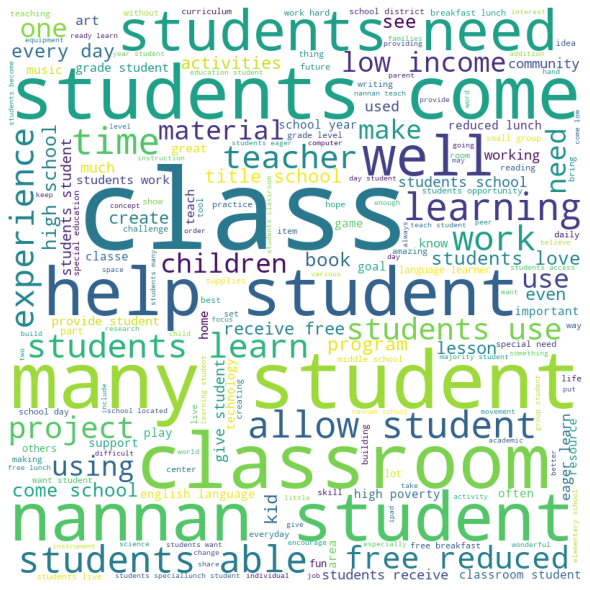

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
75368,3,Mrs.,SC,2016-12-14 10:50:37,Grades 6-8,0,History_Civics,History_Geography,97.68,teach wonderful school fun loving students stu...,history unlocked,students need items create breakoutedu kit unl...,3,166,97,1
57337,0,Ms.,CA,2016-10-07 18:06:53,Grades 3-5,1,Health_Sports,Gym_Fitness Health_Wellness,461.64,want inspire others like brother inspired says...,recess running club,students need track field essentials stopwatch...,6,217,461,1
10811,1,Mrs.,OH,2016-06-24 20:26:24,Grades PreK-2,1,Literacy_Language Math_Science,Literacy Mathematics,136.60,teacher low income high poverty school system ...,cozy classroom learners succeed,students need math word work manipulatives pro...,2,131,136,1
40675,25,Mr.,GA,2016-09-01 01:00:45,Grades 3-5,1,Health_Sports Math_Science,Health_Wellness Mathematics,657.76,typical school day almost never go day without...,fitbits us 2,students need 3 fitbit smart watches printer p...,2,79,657,1


In [0]:
analysis(e2,2)
print("Some datapoints from the cluster:")
d.get_group(1)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like class and classroom lot.
    2. We find some similarity in the datapoints of cluster 2 
    3. summaries are similare.

  2%|▏         | 209/12170 [00:00<00:05, 2086.93it/s]

Analysis for CLUSTER 3


100%|██████████| 12170/12170 [01:24<00:00, 143.91it/s]


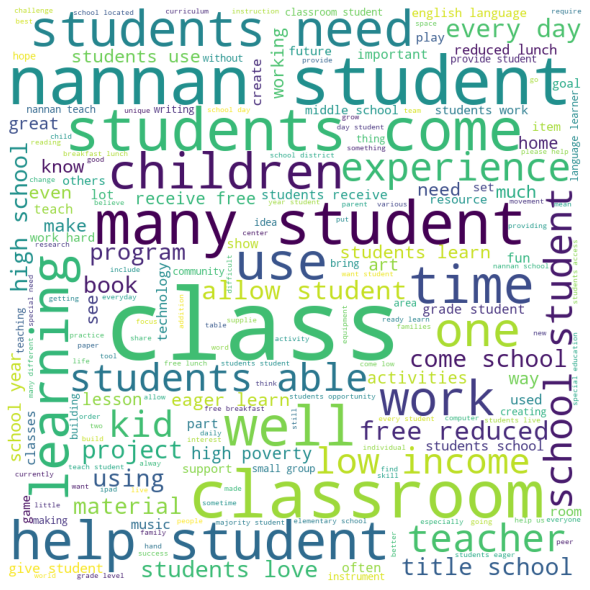

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
5010,13,Mrs.,CA,2016-05-24 00:20:00,Grades PreK-2,0,Math_Science,EnvironmentalScience,173.61,school located inner city los angeles many com...,buidling recycling habit mind,students need recycling bins poster board mark...,5,245,173,2
67334,46,Mrs.,AZ,2016-11-15 22:19:41,Grades PreK-2,1,Math_Science Music_Arts,AppliedSciences Music,144.99,students second graders high poverty school st...,dot dash get artsy create music,students need 2 dot robots 2 xylophones 2 acce...,2,107,144,2
39413,0,Mr.,NY,2016-08-31 15:15:09,Grades 6-8,0,History_Civics Literacy_Language,History_Geography Literacy,192.71,students academically racially geographically ...,connecting current events technology,students need class set chromebooks bridge gap...,2,122,192,2
15320,8,Mr.,TN,2016-07-17 22:10:12,Grades 6-8,1,Math_Science,EnvironmentalScience,249.99,students enthusiasm encourages day need challe...,laser printing stem,students need laser printer print work stem sc...,3,138,249,2


In [0]:
analysis(e3,3)
print("Some datapoints from the cluster:")
d.get_group(2)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like learning and students come appear a lot.
    2. We find some similarity in the datapoints of cluster 3 
    3. clean categories are similar.

  4%|▍         | 161/3608 [00:00<00:02, 1594.80it/s]

Analysis for CLUSTER 4


100%|██████████| 3608/3608 [00:34<00:00, 105.78it/s]


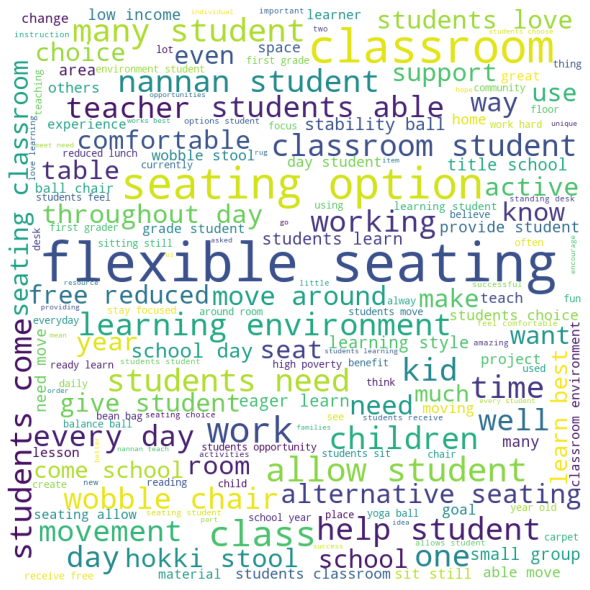

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
97721,2,Mrs.,AZ,2017-03-11 15:58:35,Grades 3-5,1,Health_Sports,Health_Wellness,110.46,cool phrase often heard classroom hear proclai...,wiggle wobble need different seats different l...,students need 6 hokki stools wobble seats crea...,2,98,110,3
25639,1,Mrs.,TX,2016-08-07 23:21:13,Grades PreK-2,1,Health_Sports,Health_Wellness,290.57,classroom full energetic first grade children ...,strengthening muscles brains time,students need variety seating achieve goals cl...,5,184,290,3
2222,0,Ms.,CA,2016-05-07 02:02:40,Grades 3-5,1,Literacy_Language Math_Science,Literature_Writing Mathematics,207.35,simplest powerful innovation give students cho...,engaging minds flexible seating,students need choices seating options stabilit...,2,94,207,3
58182,0,Mrs.,CA,2016-10-11 00:04:28,Grades PreK-2,1,AppliedLearning Health_Sports,EarlyDevelopment Health_Wellness,664.49,first grade classroom place learning discovery...,stand learning,students need two standing desks stools provid...,3,158,664,3


In [0]:
analysis(e4,4)
print("Some datapoints from the cluster:")
d.get_group(3)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like flexible seating and seating option appear a lot.
    2. We find some similarity in the datapoints of cluster 4 
    3. This cluster is segregated based on infrastructure needs.

 11%|█▏        | 141/1247 [00:00<00:00, 1403.22it/s]

Analysis for CLUSTER 5


100%|██████████| 1247/1247 [00:13<00:00, 93.01it/s]


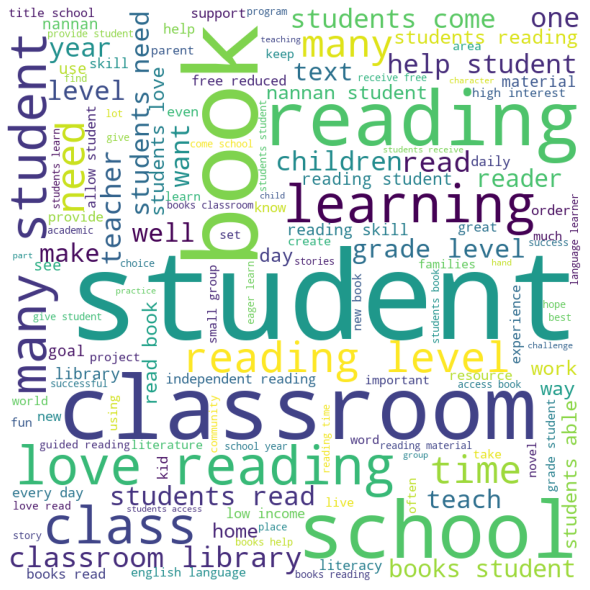

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
16607,0,Ms.,MI,2016-07-21 12:55:53,Grades 3-5,1,Literacy_Language,Literacy Literature_Writing,11.66,title low income tk 5 elementary school locate...,great books great lakes kids,students need individual copies books bud not ...,6,108,11,4
25703,4,Ms.,TX,2016-08-08 03:52:04,Grades 3-5,1,Literacy_Language,ESL Literacy,255.63,students english language learners love learn ...,color coding thinking reading,students need post notes various colors color ...,3,129,255,4
82103,0,Mrs.,CA,2017-01-11 13:49:18,Grades 3-5,1,Literacy_Language SpecialNeeds,Literacy SpecialNeeds,1956.00,students special needs learners not let disabi...,classroom library struggling readers,students need variety leveled books range kind...,1,103,1956,4
41634,4,Mrs.,UT,2016-09-01 13:08:26,Grades 6-8,1,Literacy_Language,Literacy,802.87,inner city minority majority school racial eth...,hook line sinker motivating struggling readers,students need high interest low level books al...,1,100,802,4


In [0]:
analysis(e5,5)
print("Some datapoints from the cluster:")
d.get_group(4)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like books and reading appear a lot.
    2. We find some similarity in the datapoints of cluster 5
    3. This cluster is segregated on the based of reading requirements and is mostly related to reading

  6%|▋         | 189/2941 [00:00<00:01, 1881.68it/s]

Analysis for CLUSTER 6


100%|██████████| 2941/2941 [00:22<00:00, 131.99it/s]


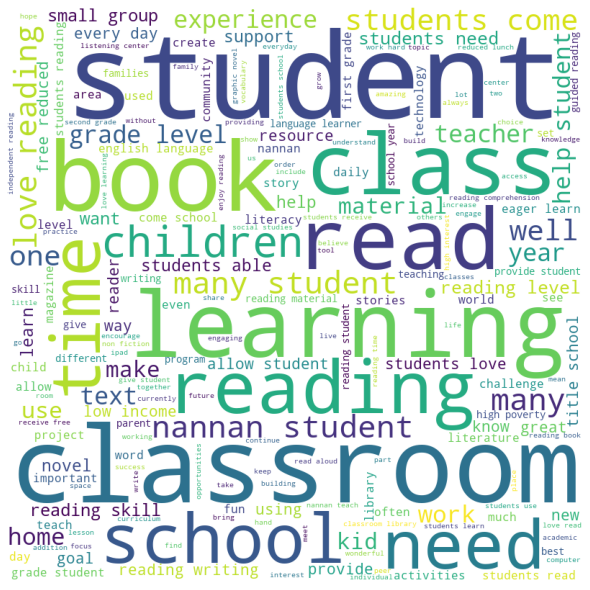

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
49647,5,Mrs.,AK,2016-09-17 18:44:05,Grades 3-5,1,Literacy_Language SpecialNeeds,Literacy SpecialNeeds,247.10,teach school high poverty 60 students economic...,let get reading zone,students need high interest low level hi lo bo...,4,203,247,5
2451,3,Ms.,NC,2016-05-09 14:07:37,Grades PreK-2,1,Literacy_Language History_Civics,Literacy SocialSciences,5.25,typical day class would filled movement questi...,increasing global awareness,students need 32 magazines include stories hol...,6,201,5,5
62572,0,Teacher,TN,2016-10-27 17:09:35,Grades PreK-2,0,Literacy_Language,Literacy,428.07,provide literacy instruction students come pov...,fall love reading,students need vibrant effective listening cent...,0,213,428,5
77608,72,Mrs.,NV,2016-12-24 12:45:53,Grades PreK-2,1,Literacy_Language,ESL Literacy,338.92,students school many different backgrounds man...,pocket charts phonics activities kindergartene...,students need phonics literacy games activitie...,1,132,338,5


In [0]:
analysis(e6,6)
print("Some datapoints from the cluster:")
d.get_group(5)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like children and class appear a lot.
    2. We find some similarity in the datapoints of cluster 6 
    3. categories and subcategories appear to be similar.

  4%|▍         | 116/2911 [00:00<00:02, 1154.14it/s]

Analysis for CLUSTER 7


100%|██████████| 2911/2911 [00:52<00:00, 55.01it/s]


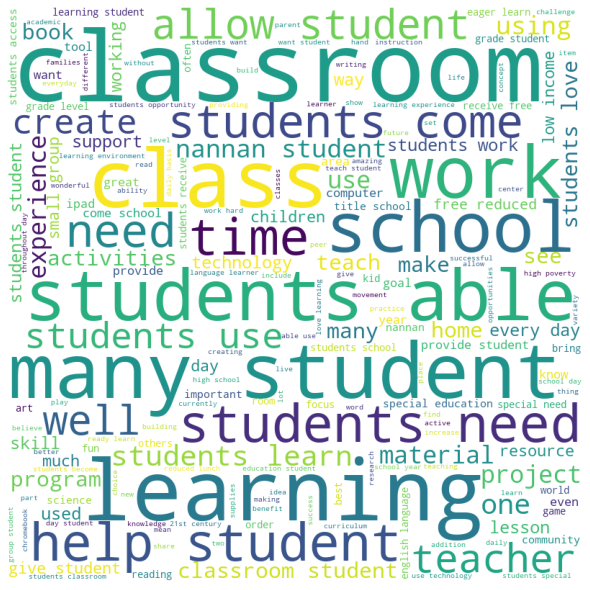

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
13068,0,Mrs.,IA,2016-07-07 15:00:46,Grades PreK-2,1,Literacy_Language,Literacy Literature_Writing,429.50,teacher low income high poverty school student...,new books amazing group 1st graders,students need new quality engaging books make ...,3,113,429,6
84021,2,Mrs.,GA,2017-01-18 09:05:53,Grades PreK-2,1,SpecialNeeds,SpecialNeeds,38.99,3 4 year old preschool students lots energy wi...,need cube chairs stay actively engaged circle,students need flexible seating sturdy foundati...,6,115,38,6
77134,0,Mrs.,MA,2016-12-21 18:03:33,Grades 3-5,1,SpecialNeeds,SpecialNeeds,174.78,best job whole world wonderful opportunity wor...,chrome books eager minds,students need 10 chrome books aide successfull...,3,110,174,6
39203,0,Teacher,CA,2016-08-31 00:27:53,Grades PreK-2,0,Literacy_Language Math_Science,Literacy Mathematics,646.97,many students seen much people could imagine s...,flexible seating extra fun learning,students need couches organizers create flexib...,3,98,646,6


In [0]:
analysis(e7,7)
print("Some datapoints from the cluster:")
d.get_group(6)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like students able and learning appear a lot.
    2. We find some similarity in the datapoints of cluster 7 
    3. sub categories may be similar

  4%|▎         | 174/4952 [00:00<00:02, 1723.53it/s]

Analysis for CLUSTER 8


100%|██████████| 4952/4952 [00:42<00:00, 115.49it/s]


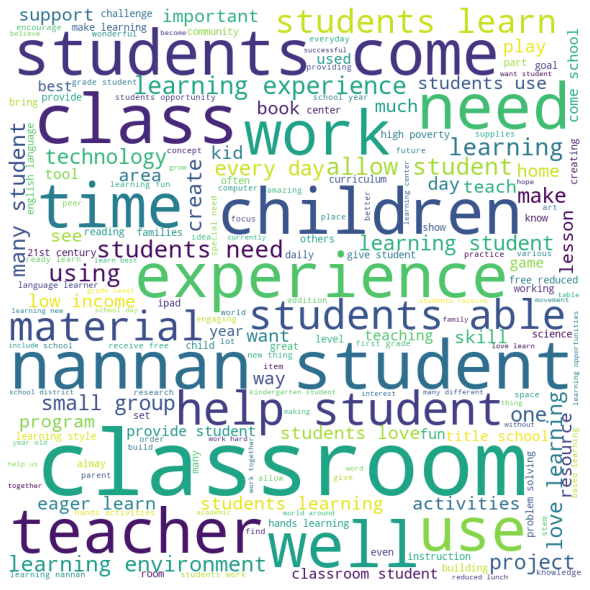

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
94089,9,Mrs.,CA,2017-02-23 22:29:20,Grades PreK-2,1,Math_Science,Mathematics,487.20,students eager learners need hands learning ma...,family game night,students need math family engagement packs big...,3,129,487,7
32114,0,Ms.,NC,2016-08-18 13:33:22,Grades 3-5,1,Literacy_Language Math_Science,Literature_Writing Mathematics,199.98,day students come school willing eager learn w...,digital learning classroom,students need chromebooks classroom use litera...,3,106,199,7
102901,2,Mrs.,NY,2017-03-29 20:56:06,Grades PreK-2,1,AppliedLearning,EarlyDevelopment Extracurricular,114.74,students face challenges classroom every day s...,play stem learning,students need stem activities enhance play exp...,4,175,114,7
47007,0,Mrs.,AZ,2016-09-11 14:32:22,Grades PreK-2,0,Math_Science,AppliedSciences EnvironmentalScience,852.98,fortunate teacher 23 wonderfully inspired uniq...,imagine create improve super scientists need s...,students need good selection science engineeri...,4,123,852,7


In [0]:
analysis(e8,8)
print("Some datapoints from the cluster:")
d.get_group(7)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like teacher and material appear a lot.
    2. We find some similarity in the datapoints of cluster 8 

 12%|█▏        | 149/1241 [00:00<00:00, 1478.36it/s]

Analysis for CLUSTER 9


100%|██████████| 1241/1241 [00:09<00:00, 125.75it/s]


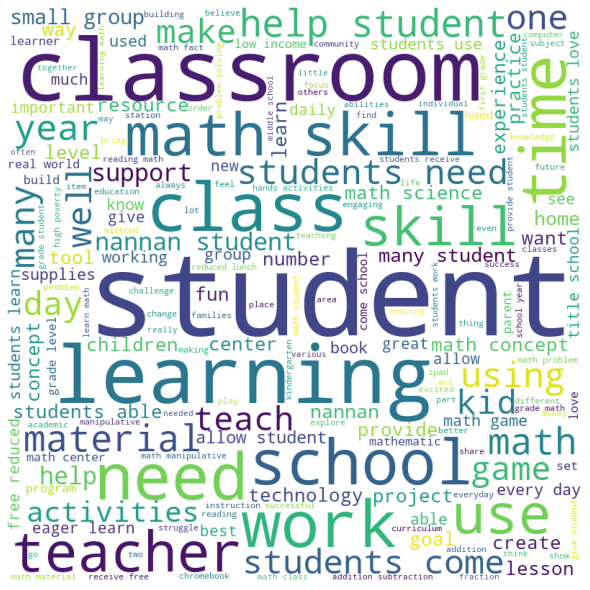

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
80778,24,Ms.,WA,2017-01-07 22:58:11,Grades PreK-2,1,Math_Science,Mathematics,178.94,kindergarten classroom bursting energy joy urg...,kinders learning math home,students need math materials use home dice ten...,0,98,178,8
61288,5,Mrs.,PA,2016-10-22 16:49:03,Grades 3-5,1,Math_Science,AppliedSciences Mathematics,608.12,students full energy excitement learn best ful...,product motivation part one,students need highly engaging folder games mat...,4,232,608,8
29810,0,Mrs.,CA,2016-08-14 21:56:42,Grades PreK-2,1,Math_Science,Mathematics,121.88,work low income area high desert southern cali...,magical math manipulatives,students need math manipulatives successful co...,2,164,121,8
25048,1,Mrs.,FL,2016-08-06 23:25:14,Grades PreK-2,1,Math_Science,Mathematics,199.00,classroom first graders creative eager learn m...,everyday calculating,students need 8 instant math centers help lear...,2,193,199,8


In [0]:
analysis(e9,9)
print("Some datapoints from the cluster:")
d.get_group(8)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like skill and math skill appear a lot.
    2. We find some similarity in the datapoints of cluster 9 
    3. This cluster is segregated based on the category mathematics.

  5%|▍         | 168/3575 [00:00<00:02, 1662.91it/s]

Analysis for CLUSTER 10


100%|██████████| 3575/3575 [00:33<00:00, 106.90it/s]


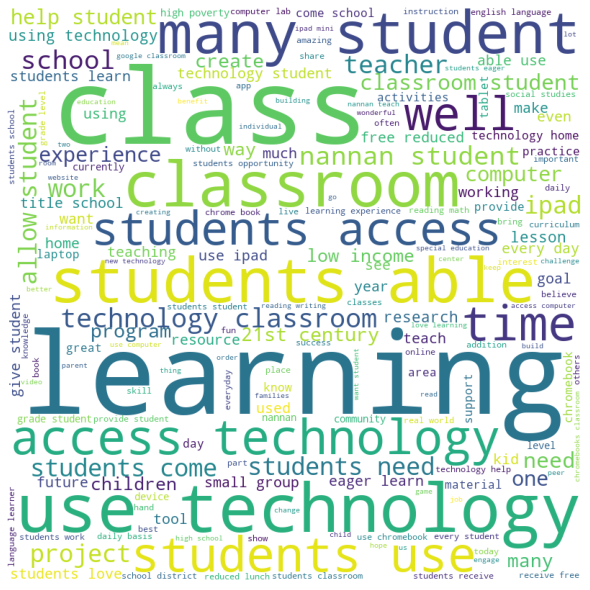

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
75775,0,Mr.,CA,2016-12-15 17:46:38,Grades PreK-2,1,Math_Science,Health_LifeScience Mathematics,401.21,teaching 20 years work small groups students r...,creativity chromebooks,students need 4 chromebooks charging station g...,1,131,401,9
41104,5,Mrs.,GA,2016-09-01 07:52:10,Grades 3-5,1,Math_Science Music_Arts,EnvironmentalScience VisualArts,705.90,robert frost writes two roads diverged wood to...,not throw away learning opportunity,students need experience creating 3 forms unde...,1,215,705,9
73155,11,Mrs.,IL,2016-12-05 09:54:58,Grades 3-5,1,Literacy_Language Math_Science,Literacy Mathematics,159.43,want see students reach fullest potential deve...,project 1 1 chromebook works,students need additional chromebook use classr...,2,129,159,9
80552,10,Teacher,TX,2017-01-06 19:09:16,Grades 3-5,1,Math_Science,AppliedSciences Mathematics,191.99,majority not students come low socioeconomic b...,chrome us,students need 2 google chromebooks improve tec...,2,179,191,9


In [0]:
analysis(e10,10)
print("Some datapoints from the cluster:")
d.get_group(9)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like learining and technology appear a lot.
    2. We find some similarity in the datapoints of cluster 10. 
    3. The word chromebook appears a lot.

  3%|▎         | 251/7781 [00:00<00:03, 2504.26it/s]

Analysis for CLUSTER 11


100%|██████████| 7781/7781 [00:47<00:00, 162.85it/s]


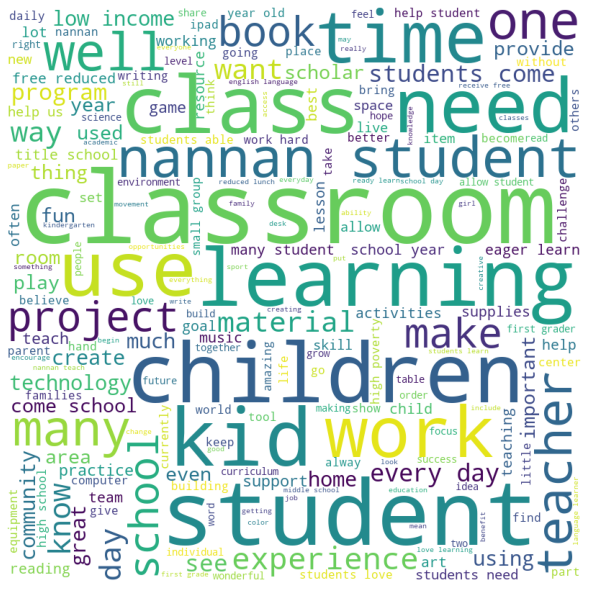

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels
6965,1,Mrs.,NY,2016-06-02 20:54:22,Grades PreK-2,1,Literacy_Language,ESL Literacy,369.00,kindergarteners busy enthusiastic little learn...,book bins build better readers,students need bookshelf eight roomy bins offer...,0,124,369,10
79415,26,Mrs.,MI,2017-01-03 12:02:11,Grades 3-5,1,Health_Sports,Health_Wellness,137.86,best beautiful things world cannot seen touche...,desk short desks right,students need adjustable desks chairs long days,3,171,137,10
102844,0,Mrs.,OH,2017-03-29 19:36:49,Grades PreK-2,1,AppliedLearning,EarlyDevelopment,256.93,students enjoy working together complete puzzl...,puzzles please,students need puzzles love puzzles mastered on...,1,117,256,10
20545,26,Mrs.,CA,2016-08-01 18:37:05,Grades PreK-2,0,Math_Science Music_Arts,AppliedSciences PerformingArts,354.91,teaching kindergarten school 17 years everyday...,let get creative,students need new building manipulatives prete...,3,132,354,10


In [0]:
analysis(e11,11)
print("Some datapoints from the cluster:")
d.get_group(10)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like kid appear a lot.
    2. We find some similarity in the datapoints of cluster 11 
    3. The clustering shows some points with regard to pre kindergarten students.

<h2>2.6 Apply AgglomerativeClustering</h2>

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_auc_score
from matplotlib import pylab
from tqdm import tqdm
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import AgglomerativeClustering
#from sklearn.calibration import CalibratedClassifierCV 
import math
import numpy as np
#x11_train=x
#y11_train= y
labels = []
cv = []
x= X.toarray()
#k1 = np.arange(0,2,0.0001)
number_of_clusters= [2,3]
 
for j in tqdm(number_of_clusters):
    neigh = AgglomerativeClustering(n_clusters=j, affinity="euclidean", memory=None, connectivity=None, compute_full_tree="auto", linkage="ward")
    neigh.fit(x[0:8500])
    labels.append(neigh.labels_)

100%|██████████| 2/2 [05:46<00:00, 173.45s/it]


In [0]:
neigh = AgglomerativeClustering(n_clusters=5, affinity="euclidean", memory=None, connectivity=None, compute_full_tree="auto", linkage="ward")
neigh.fit(x[0:8500])
c=neigh.labels_

In [0]:
data= data_train[0:8500]  
data["labels_agglo"]=labels[0]
d= data.groupby("labels_agglo")
print("n_clusters= 2")
print("the size of cluster 1 is: ",d.get_group(0).shape)
print("the size of cluster 2 is: ",d.get_group(1).shape)
e1= d.get_group(0).processed_essays
e2= d.get_group(1).processed_essays

print("="*50)
print("n_clusters= 3")
data["labels_agglo1"]=labels[1]
e= data.groupby("labels_agglo1")
print("the size of cluster 1 is: ",e.get_group(0).shape)
print("the size of cluster 2 is: ",e.get_group(1).shape)
print("the size of cluster 3 is: ",e.get_group(2).shape)
f1= e.get_group(0).processed_essays
f2= e.get_group(1).processed_essays
f3= e.get_group(2).processed_essays

print("="*50)
print("n_clusters= 5")
data["labels_agglo2"]=c
f= data.groupby("labels_agglo2")
print("the size of cluster 1 is: ",f.get_group(0).shape)
print("the size of cluster 2 is: ",f.get_group(1).shape)
print("the size of cluster 3 is: ",f.get_group(2).shape)
print("the size of cluster 4 is: ",f.get_group(3).shape)
print("the size of cluster 5 is: ",f.get_group(4).shape)
g1= f.get_group(0).processed_essays
g2= f.get_group(1).processed_essays
g3= f.get_group(2).processed_essays
g4= f.get_group(3).processed_essays
g5= f.get_group(4).processed_essays



n_clusters= 2
the size of cluster 1 is:  (7292, 17)
the size of cluster 2 is:  (1208, 17)
n_clusters= 3
the size of cluster 1 is:  (4179, 18)
the size of cluster 2 is:  (1208, 18)
the size of cluster 3 is:  (3113, 18)
n_clusters= 5
the size of cluster 1 is:  (3113, 19)
the size of cluster 2 is:  (1208, 19)
the size of cluster 3 is:  (3144, 19)
the size of cluster 4 is:  (385, 19)
the size of cluster 5 is:  (650, 19)


## Word Cloud

### 1. Cluster size=2

  3%|▎         | 208/7292 [00:00<00:03, 2075.80it/s]

Analysis for CLUSTER 1


100%|██████████| 7292/7292 [01:06<00:00, 109.92it/s]


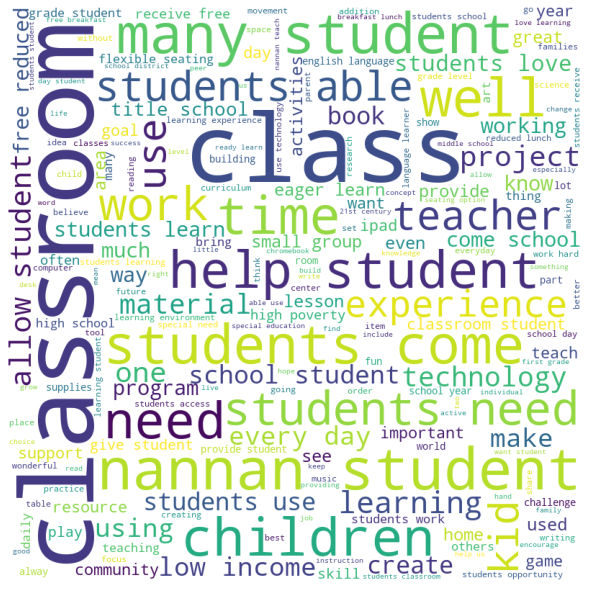

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
75368,3,Mrs.,SC,2016-12-14 10:50:37,Grades 6-8,0,History_Civics,History_Geography,97.68,teach wonderful school fun loving students stu...,history unlocked,students need items create breakoutedu kit unl...,3,166,97,1,0,0,2
14667,63,Mr.,VA,2016-07-14 16:33:30,Grades 3-5,1,Health_Sports,Gym_Fitness TeamSports,250.92,students school motivated hard working energet...,young athletes need baseball equipment,students need right hand throw left hand throw...,3,105,250,2,0,2,0
30222,1,Mrs.,FL,2016-08-15 18:58:44,Grades PreK-2,1,Health_Sports,Gym_Fitness Health_Wellness,565.81,second graders energetic smart eager learn stu...,flexible seating healthier happier 2nd graders,students need flexible seating options includi...,4,151,565,3,0,0,4
97721,2,Mrs.,AZ,2017-03-11 15:58:35,Grades 3-5,1,Health_Sports,Health_Wellness,110.46,cool phrase often heard classroom hear proclai...,wiggle wobble need different seats different l...,students need 6 hokki stools wobble seats crea...,2,98,110,3,0,0,4


In [0]:
analysis(e1,1)
print("Some datapoints from the cluster:")
d.get_group(0)[1:5]

#### Obersvations:
    1. Here only two clusters have been obtained.
    2. We find some similarity in the datapoints of cluster 1 
    3. This cluster is segregated based on words classroom and students.

 13%|█▎        | 157/1208 [00:00<00:00, 1563.20it/s]

Analysis for CLUSTER 2


100%|██████████| 1208/1208 [00:08<00:00, 147.06it/s]


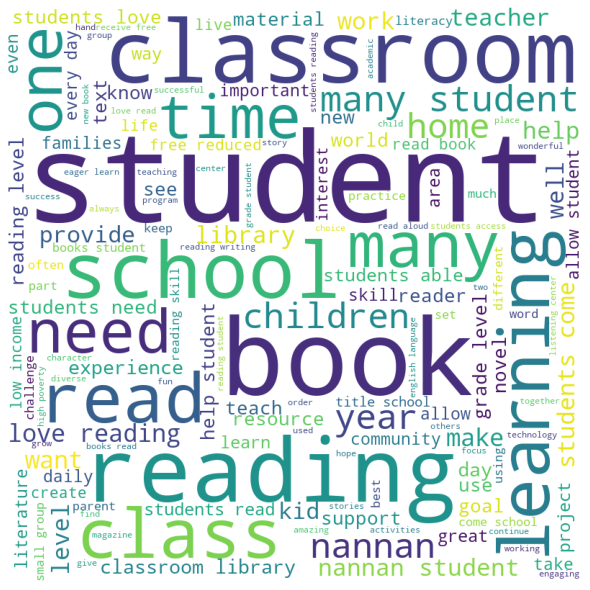

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
102162,17,Ms.,SC,2017-03-28 22:31:30,Grades 6-8,1,Literacy_Language,Literacy,267.34,school typical low key suburban middle school ...,diverse books diverse students,students need high interest books diverse char...,3,110,267,0,1,1,1
10741,9,Mrs.,OH,2016-06-24 13:05:56,Grades 6-8,1,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,8.45,students bright energetic 6th graders small di...,wonder ful world could,students need 115 copies r j palacio novel won...,4,134,8,1,1,1,1
6965,1,Mrs.,NY,2016-06-02 20:54:22,Grades PreK-2,1,Literacy_Language,ESL Literacy,369.00,kindergarteners busy enthusiastic little learn...,book bins build better readers,students need bookshelf eight roomy bins offer...,0,124,369,10,1,1,1
13068,0,Mrs.,IA,2016-07-07 15:00:46,Grades PreK-2,1,Literacy_Language,Literacy Literature_Writing,429.50,teacher low income high poverty school student...,new books amazing group 1st graders,students need new quality engaging books make ...,3,113,429,6,1,1,1


In [0]:
analysis(e2,2)
print("Some datapoints from the cluster:")
d.get_group(1)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like reading and books appear a lot.
    2. We find some similarity in the datapoints of cluster 2 
    3. Here the cluster is broadly obtained based on reading requirements and books for kids.

### 2. Cluster size=3

  3%|▎         | 144/4179 [00:00<00:02, 1434.70it/s]

Analysis for CLUSTER 1


100%|██████████| 4179/4179 [00:39<00:00, 105.72it/s]


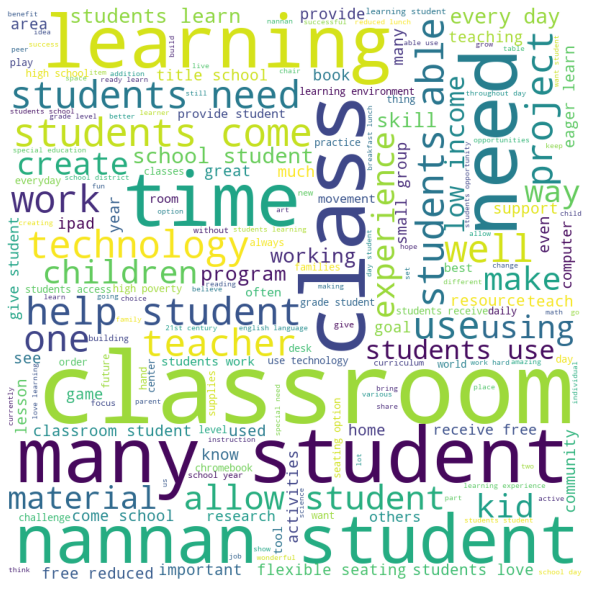

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
30222,1,Mrs.,FL,2016-08-15 18:58:44,Grades PreK-2,1,Health_Sports,Gym_Fitness Health_Wellness,565.81,second graders energetic smart eager learn stu...,flexible seating healthier happier 2nd graders,students need flexible seating options includi...,4,151,565,3,0,0,4
97721,2,Mrs.,AZ,2017-03-11 15:58:35,Grades 3-5,1,Health_Sports,Health_Wellness,110.46,cool phrase often heard classroom hear proclai...,wiggle wobble need different seats different l...,students need 6 hokki stools wobble seats crea...,2,98,110,3,0,0,4
57337,0,Ms.,CA,2016-10-07 18:06:53,Grades 3-5,1,Health_Sports,Gym_Fitness Health_Wellness,461.64,want inspire others like brother inspired says...,recess running club,students need track field essentials stopwatch...,6,217,461,1,0,0,2
79415,26,Mrs.,MI,2017-01-03 12:02:11,Grades 3-5,1,Health_Sports,Health_Wellness,137.86,best beautiful things world cannot seen touche...,desk short desks right,students need adjustable desks chairs long days,3,171,137,10,0,0,2


In [0]:
analysis(f1,1)
print("Some datapoints from the cluster:")
e.get_group(0)[1:5]

#### Obersvations:
    1. Here only 3 clusters have been obtained.
    2. We find some similarity in the datapoints of cluster 1 
    3. This cluster is segregated based on words classroom and students.

 12%|█▏        | 149/1208 [00:00<00:00, 1481.16it/s]

Analysis for CLUSTER 2


100%|██████████| 1208/1208 [00:08<00:00, 148.51it/s]


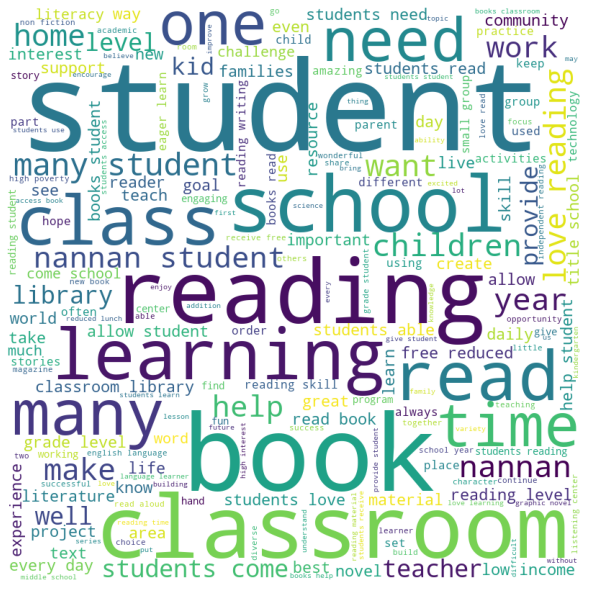

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
102162,17,Ms.,SC,2017-03-28 22:31:30,Grades 6-8,1,Literacy_Language,Literacy,267.34,school typical low key suburban middle school ...,diverse books diverse students,students need high interest books diverse char...,3,110,267,0,1,1,1
10741,9,Mrs.,OH,2016-06-24 13:05:56,Grades 6-8,1,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,8.45,students bright energetic 6th graders small di...,wonder ful world could,students need 115 copies r j palacio novel won...,4,134,8,1,1,1,1
6965,1,Mrs.,NY,2016-06-02 20:54:22,Grades PreK-2,1,Literacy_Language,ESL Literacy,369.00,kindergarteners busy enthusiastic little learn...,book bins build better readers,students need bookshelf eight roomy bins offer...,0,124,369,10,1,1,1
13068,0,Mrs.,IA,2016-07-07 15:00:46,Grades PreK-2,1,Literacy_Language,Literacy Literature_Writing,429.50,teacher low income high poverty school student...,new books amazing group 1st graders,students need new quality engaging books make ...,3,113,429,6,1,1,1


In [0]:
analysis(f2,2)
print("Some datapoints from the cluster:")
e.get_group(1)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like reading and books appear a lot.
    2. We find some similarity in the datapoints of cluster 2 
    3. Here the cluster is broadly obtained based on reading requirements and books for kids.

  6%|▌         | 184/3113 [00:00<00:01, 1830.51it/s]

Analysis for CLUSTER 3


100%|██████████| 3113/3113 [00:21<00:00, 146.63it/s]


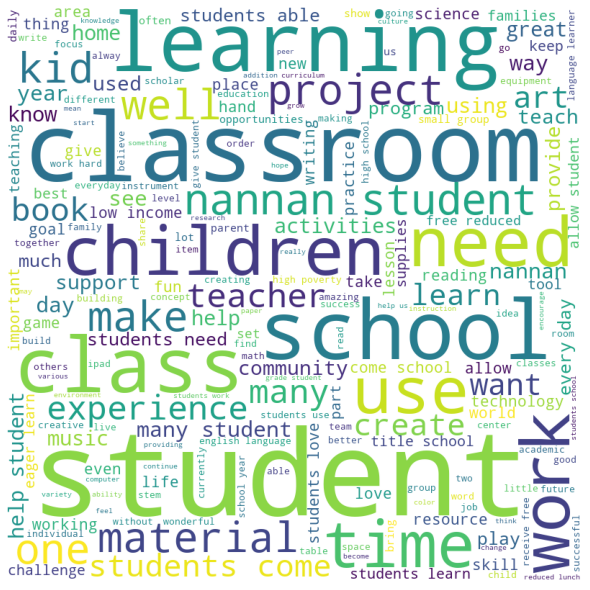

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
14667,63,Mr.,VA,2016-07-14 16:33:30,Grades 3-5,1,Health_Sports,Gym_Fitness TeamSports,250.92,students school motivated hard working energet...,young athletes need baseball equipment,students need right hand throw left hand throw...,3,105,250,2,0,2,0
29226,86,Mrs.,IN,2016-08-13 17:10:53,Grades PreK-2,1,Math_Science,Mathematics,343.80,students best sweet energetic full love want l...,need number sense,students need number puzzles counting activity...,3,101,343,7,0,2,0
102844,0,Mrs.,OH,2017-03-29 19:36:49,Grades PreK-2,1,AppliedLearning,EarlyDevelopment,256.93,students enjoy working together complete puzzl...,puzzles please,students need puzzles love puzzles mastered on...,1,117,256,10,0,2,0
20545,26,Mrs.,CA,2016-08-01 18:37:05,Grades PreK-2,0,Math_Science Music_Arts,AppliedSciences PerformingArts,354.91,teaching kindergarten school 17 years everyday...,let get creative,students need new building manipulatives prete...,3,132,354,10,0,2,0


In [0]:
analysis(f3,3)
print("Some datapoints from the cluster:")
e.get_group(2)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like reading and books appear a lot.
    2. We find some similarity in the datapoints of cluster 3
    3. Here the cluster is broadly obtained based on reading requirements and books for kids.

### 3. Cluster size=5

  6%|▌         | 179/3113 [00:00<00:01, 1781.01it/s]

Analysis for CLUSTER 1


100%|██████████| 3113/3113 [00:21<00:00, 144.35it/s]


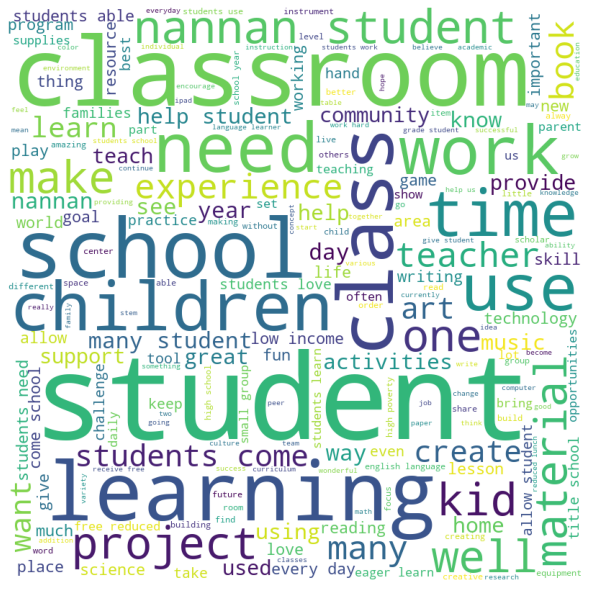

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
14667,63,Mr.,VA,2016-07-14 16:33:30,Grades 3-5,1,Health_Sports,Gym_Fitness TeamSports,250.92,students school motivated hard working energet...,young athletes need baseball equipment,students need right hand throw left hand throw...,3,105,250,2,0,2,0
29226,86,Mrs.,IN,2016-08-13 17:10:53,Grades PreK-2,1,Math_Science,Mathematics,343.80,students best sweet energetic full love want l...,need number sense,students need number puzzles counting activity...,3,101,343,7,0,2,0
102844,0,Mrs.,OH,2017-03-29 19:36:49,Grades PreK-2,1,AppliedLearning,EarlyDevelopment,256.93,students enjoy working together complete puzzl...,puzzles please,students need puzzles love puzzles mastered on...,1,117,256,10,0,2,0
20545,26,Mrs.,CA,2016-08-01 18:37:05,Grades PreK-2,0,Math_Science Music_Arts,AppliedSciences PerformingArts,354.91,teaching kindergarten school 17 years everyday...,let get creative,students need new building manipulatives prete...,3,132,354,10,0,2,0


In [0]:
analysis(g1,1)
print("Some datapoints from the cluster:")
f.get_group(0)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like classroom and students appear a lot.
    2. We find some similarity in the datapoints of cluster 1 
    3. Here the cluster is segregrated with regard to improving creativity.

 14%|█▍        | 168/1208 [00:00<00:00, 1672.56it/s]

Analysis for CLUSTER 2


100%|██████████| 1208/1208 [00:08<00:00, 148.72it/s]


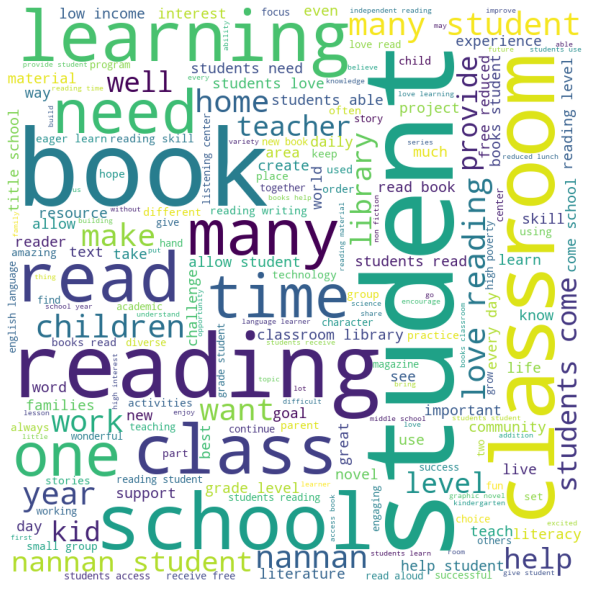

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
102162,17,Ms.,SC,2017-03-28 22:31:30,Grades 6-8,1,Literacy_Language,Literacy,267.34,school typical low key suburban middle school ...,diverse books diverse students,students need high interest books diverse char...,3,110,267,0,1,1,1
10741,9,Mrs.,OH,2016-06-24 13:05:56,Grades 6-8,1,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,8.45,students bright energetic 6th graders small di...,wonder ful world could,students need 115 copies r j palacio novel won...,4,134,8,1,1,1,1
6965,1,Mrs.,NY,2016-06-02 20:54:22,Grades PreK-2,1,Literacy_Language,ESL Literacy,369.00,kindergarteners busy enthusiastic little learn...,book bins build better readers,students need bookshelf eight roomy bins offer...,0,124,369,10,1,1,1
13068,0,Mrs.,IA,2016-07-07 15:00:46,Grades PreK-2,1,Literacy_Language,Literacy Literature_Writing,429.50,teacher low income high poverty school student...,new books amazing group 1st graders,students need new quality engaging books make ...,3,113,429,6,1,1,1


In [0]:
analysis(g2,2)
print("Some datapoints from the cluster:")
f.get_group(1)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like reading and books appear a lot.
    2. We find some similarity in the datapoints of cluster 2 
    3. Here the cluster is broadly obtained based on reading requirements and books for kids.

  5%|▌         | 160/3144 [00:00<00:01, 1519.52it/s]

Analysis for CLUSTER 3


100%|██████████| 3144/3144 [00:27<00:00, 112.94it/s]


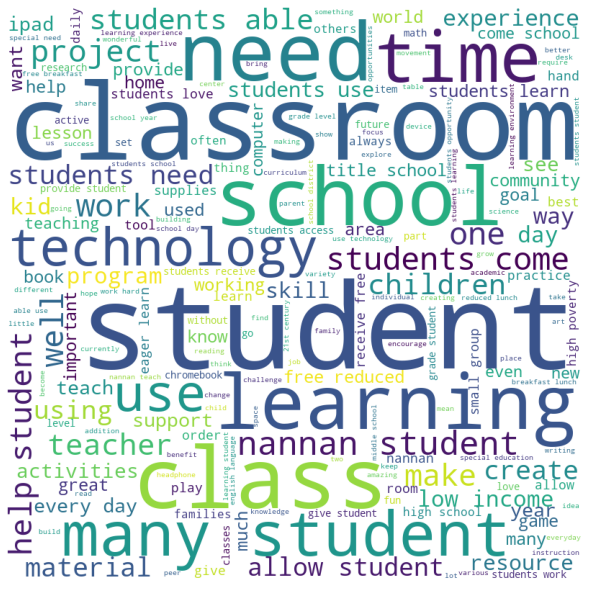

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
57337,0,Ms.,CA,2016-10-07 18:06:53,Grades 3-5,1,Health_Sports,Gym_Fitness Health_Wellness,461.64,want inspire others like brother inspired says...,recess running club,students need track field essentials stopwatch...,6,217,461,1,0,0,2
79415,26,Mrs.,MI,2017-01-03 12:02:11,Grades 3-5,1,Health_Sports,Health_Wellness,137.86,best beautiful things world cannot seen touche...,desk short desks right,students need adjustable desks chairs long days,3,171,137,10,0,0,2
10811,1,Mrs.,OH,2016-06-24 20:26:24,Grades PreK-2,1,Literacy_Language Math_Science,Literacy Mathematics,136.60,teacher low income high poverty school system ...,cozy classroom learners succeed,students need math word work manipulatives pro...,2,131,136,1,0,0,2
5010,13,Mrs.,CA,2016-05-24 00:20:00,Grades PreK-2,0,Math_Science,EnvironmentalScience,173.61,school located inner city los angeles many com...,buidling recycling habit mind,students need recycling bins poster board mark...,5,245,173,2,0,0,2


In [0]:
analysis(g3,3)
print("Some datapoints from the cluster:")
f.get_group(2)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like technology appear a lot.
    2. We find some similarity in the datapoints of cluster 3. 
    3. Here the cluster is broadly obtained based on inspring and touching essays from teachers.

 34%|███▍      | 132/385 [00:00<00:00, 1316.49it/s]

Analysis for CLUSTER 4


100%|██████████| 385/385 [00:01<00:00, 199.15it/s]


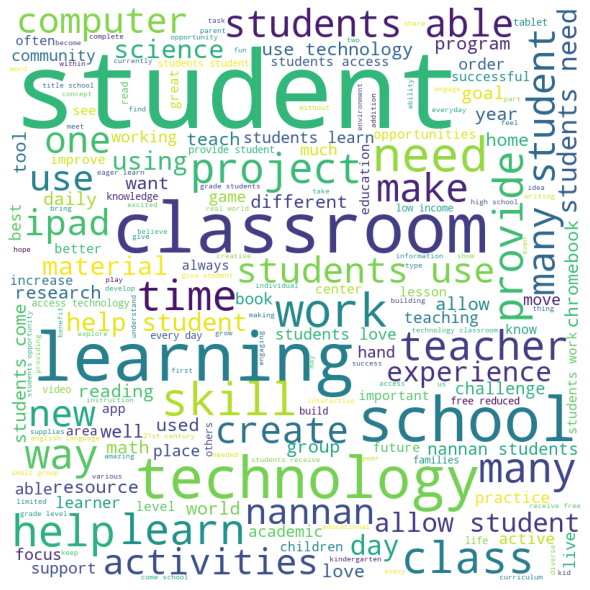

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
84021,2,Mrs.,GA,2017-01-18 09:05:53,Grades PreK-2,1,SpecialNeeds,SpecialNeeds,38.99,3 4 year old preschool students lots energy wi...,need cube chairs stay actively engaged circle,students need flexible seating sturdy foundati...,6,115,38,6,0,0,3
73155,11,Mrs.,IL,2016-12-05 09:54:58,Grades 3-5,1,Literacy_Language Math_Science,Literacy Mathematics,159.43,want see students reach fullest potential deve...,project 1 1 chromebook works,students need additional chromebook use classr...,2,129,159,9,0,0,3
43622,0,Mrs.,FL,2016-09-04 01:51:22,Grades 3-5,1,Literacy_Language Math_Science,Literacy Mathematics,159.43,proud teacher 23 fourth grade students student...,using technology connect world,students need 5 chromebooks bring closer 1 1 t...,3,248,159,9,0,0,3
73345,3,Ms.,MI,2016-12-05 20:24:12,Grades 3-5,1,Math_Science SpecialNeeds,Mathematics SpecialNeeds,883.10,students amazing many come low income families...,makey makey littlebits computer knowledge,students need different innovative technology ...,3,99,883,6,0,0,3


In [0]:
analysis(g4,4)
print("Some datapoints from the cluster:")
f.get_group(3)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that adjectives appear a lot.

 26%|██▌       | 166/650 [00:00<00:00, 1649.44it/s]

Analysis for CLUSTER 5


100%|██████████| 650/650 [00:03<00:00, 208.65it/s]


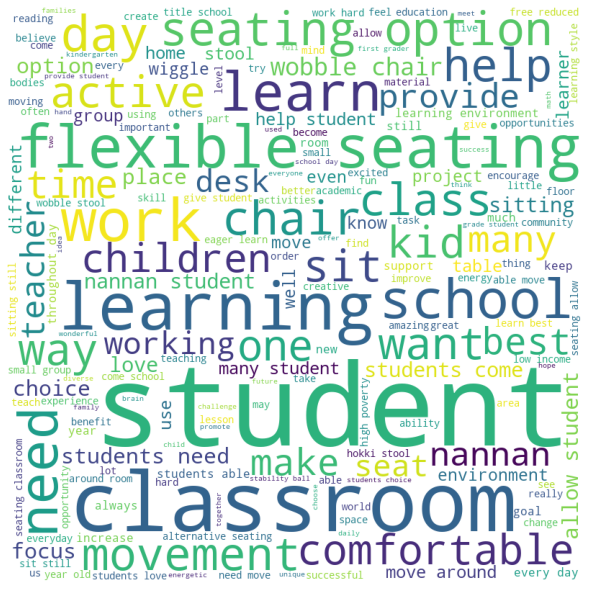

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,labels_agglo,labels_agglo1,labels_agglo2
97721,2,Mrs.,AZ,2017-03-11 15:58:35,Grades 3-5,1,Health_Sports,Health_Wellness,110.46,cool phrase often heard classroom hear proclai...,wiggle wobble need different seats different l...,students need 6 hokki stools wobble seats crea...,2,98,110,3,0,0,4
25639,1,Mrs.,TX,2016-08-07 23:21:13,Grades PreK-2,1,Health_Sports,Health_Wellness,290.57,classroom full energetic first grade children ...,strengthening muscles brains time,students need variety seating achieve goals cl...,5,184,290,3,0,0,4
2222,0,Ms.,CA,2016-05-07 02:02:40,Grades 3-5,1,Literacy_Language Math_Science,Literature_Writing Mathematics,207.35,simplest powerful innovation give students cho...,engaging minds flexible seating,students need choices seating options stabilit...,2,94,207,3,0,0,4
39203,0,Teacher,CA,2016-08-31 00:27:53,Grades PreK-2,0,Literacy_Language Math_Science,Literacy Mathematics,646.97,many students seen much people could imagine s...,flexible seating extra fun learning,students need couches organizers create flexib...,3,98,646,6,0,0,4


In [0]:
analysis(g5,5)
print("Some datapoints from the cluster:")
f.get_group(4)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like flexible seating appears a lot.
    2. We find some similarity in the datapoints of cluster 5.
    3. Here the cluster is broadly obtained based on student personality development.

<h2>2.7 Apply DBSCAN</h2>

100%|██████████| 6/6 [01:19<00:00, 13.27s/it]


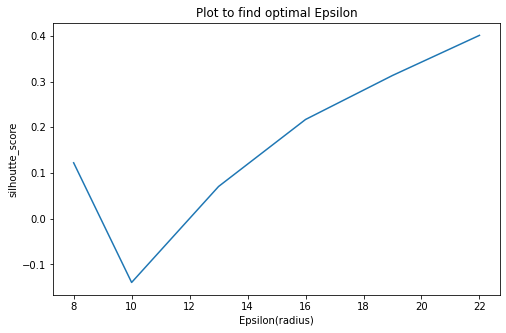

In [0]:
from sklearn.metrics import roc_curve, auc
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_auc_score
from matplotlib import pylab
from tqdm import tqdm
from sklearn.tree import DecisionTreeClassifier
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
#from sklearn.calibration import CalibratedClassifierCV 
import math
import numpy as np
#x11_train=x
#y11_train= y
inertia = []
cv = []
score=[]
#k1 = np.arange(0,2,0.0001)
#max_depths=[1,5,10,50,100,500]
#k3=[]
#for k in max_depths:
#    k3.append(math.log(k))
#for j in min_samples:
#    k2.append(math.log(j))
#    k3.append([math.log(j),j])
    #print(k3)
values=[]
eps= [8,10,13,16,19,22]   
for j in tqdm(eps):
    neigh = DBSCAN(eps=j, min_samples=5, metric="euclidean", metric_params=None, algorithm="auto", leaf_size=30, p=None, n_jobs=-1)
    neigh.fit(X[0:10000])
    score.append(silhouette_score(X[0:10000], neigh.labels_ , metric="euclidean"))
    
    
        
plt.figure(figsize=(8,5))   
plt.plot(eps,score)
plt.title("Plot to find optimal Epsilon")
plt.xlabel("Epsilon(radius)")
plt.ylabel("silhoutte_score")
plt.show()


#### Obersvations:
    1. Here we are using silhoullete scoring to find best epsilon.
    2. silhoullete scoring coefficent is calculated based on inter cluster distance.
    3. Higher the coefficent, better is the quality of clustering
    4. Here, We find that epsilon 11 is ideal for obtaining two clusters
    5. Due to data duplication and repitition of words, Our analysis may not work well sometimes.
    6. Due to memory issues, We only considered 10k datapoints.
    7. Here we find that entire datapoint is only being segregated as one cluster.
    8. The datapoints may not contain distincive point which could segregate the clusters.

In [0]:
from sklearn.cluster import DBSCAN
neigh = DBSCAN(eps=12, min_samples=4, metric="euclidean", metric_params=None, algorithm="auto", leaf_size=30, p=None, n_jobs=-1)
neigh.fit(X[0:10000])
C=neigh.labels_
D= data_train[0:10000]
D["dbscan"]= C

In [0]:
d= D.groupby("dbscan")
print("n_clusters= 2")
print("the size of cluster 1 is: ",d.get_group(0).shape)
print("the size of cluster 2 is: ",d.get_group(1).shape)
print("the size of noise is: ",d.get_group(-1).shape)
e1= d.get_group(0).processed_essays
e2= d.get_group(1).processed_essays
e3= d.get_group(-1).processed_essays

n_clusters= 2
the size of cluster 1 is:  (3996, 17)
the size of cluster 2 is:  (8, 17)
the size of noise is:  (5980, 17)


  7%|▋         | 267/3996 [00:00<00:01, 2661.87it/s]

Analysis for CLUSTER 1


100%|██████████| 3996/3996 [00:20<00:00, 190.75it/s]


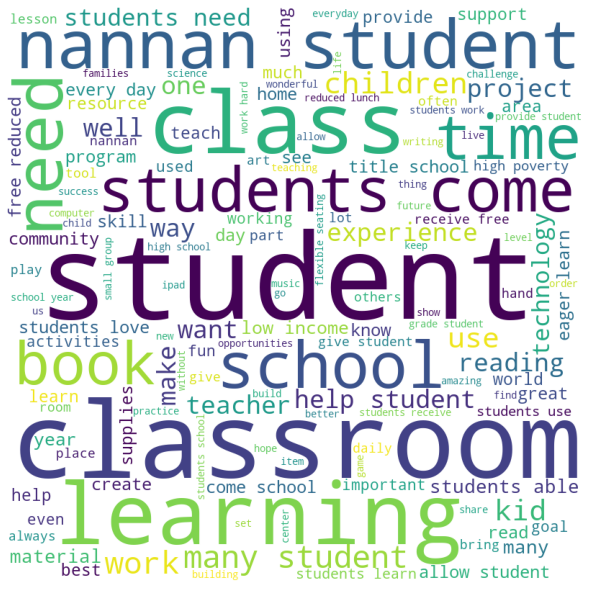

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,dbscan
20545,26,Mrs.,CA,2016-08-01 18:37:05,Grades PreK-2,0,Math_Science Music_Arts,AppliedSciences PerformingArts,354.91,teaching kindergarten school 17 years everyday...,let get creative,students need new building manipulatives prete...,3,132,354,10,0
79356,0,Ms.,WI,2017-01-03 01:29:06,Grades PreK-2,1,Literacy_Language Math_Science,Literacy Mathematics,1199.97,students amazing kids refer classroom school f...,ipads kinders,students need technology school lacks technolo...,5,183,1199,10,0
29164,5,Mrs.,NC,2016-08-13 15:28:17,Grades 3-5,0,Health_Sports,NutritionEducation,342.58,kids bright energetic group young people love ...,garden grow,students need rain barrel raised bed grow salads,4,103,342,10,0
17351,0,Ms.,PA,2016-07-24 10:46:32,Grades 3-5,1,Literacy_Language,Literacy,455.49,students walk classrooms every day full life r...,capturing meaning books listening center,students need listening center increase listen...,3,116,455,0,0


In [0]:
analysis(e1,1)
print("Some datapoints from the cluster:")
d.get_group(0)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like students and classroom appear quite a lot.
    2. We find some similarity in the datapoints of cluster 1.
    3. Here the cluster is broadly obtained based on students and classroom.

100%|██████████| 8/8 [00:00<00:00, 1082.51it/s]

Analysis for CLUSTER 2


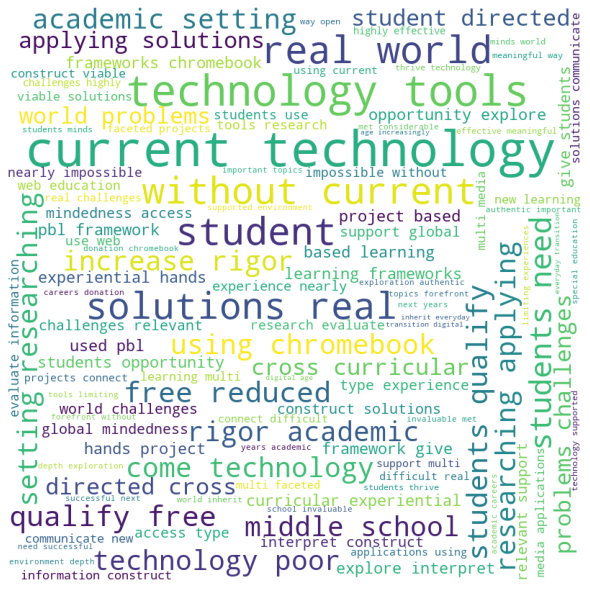

Some datapoints from the cluster:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,dbscan
76897,4,Ms.,AZ,2016-12-20 23:54:53,Grades 6-8,1,History_Civics,Civics_Government FinancialLiteracy,223.99,school strive always charging forward maintain...,chromebooks research,students need 1 chromebook 1 management consol...,3,225,223,9,1
78581,7,Mr.,AZ,2016-12-30 11:40:25,Grades 6-8,1,History_Civics Math_Science,FinancialLiteracy Mathematics,195.99,approximately 700 unique 7th 8th graders atten...,technology math,students need 2 chromebooks 2 management conso...,0,140,195,9,1
77460,0,Mrs.,AZ,2016-12-23 11:58:11,Grades 6-8,1,History_Civics,FinancialLiteracy SocialSciences,187.99,school strive always charging forward maintain...,chromebooks support engineering,students need 2 chromebooks 2 management conso...,3,140,187,9,1
27049,4,Ms.,AZ,2016-08-10 13:05:14,Grades 6-8,1,Math_Science SpecialNeeds,Mathematics SpecialNeeds,182.02,school strive always charging forward maintain...,charging forward mathematical world technology,students need 2 chromebook 2 management consol...,4,145,182,9,1


In [0]:
analysis(e2,2)
print("Some datapoints from the cluster:")
d.get_group(1)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that words like technical terms appears a lot.
    2. We find some similarity in the datapoints of cluster 2.
    3. Here the cluster is broadly obtained based on technical terms.

  3%|▎         | 158/5980 [00:00<00:03, 1568.64it/s]

Analysis for CLUSTER 3


100%|██████████| 5980/5980 [01:06<00:00, 89.87it/s]


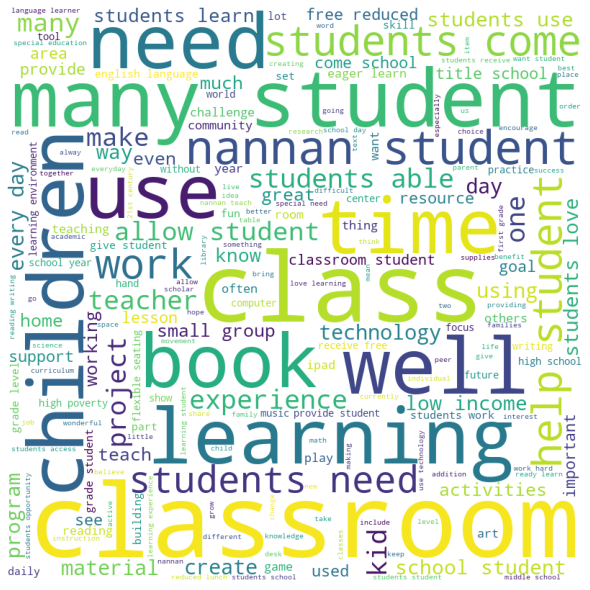

Some datapoints from the noise:


,teacher_number_of_previously_posted_projects,teacher_prefix,school_state,Date,project_grade_category,project_is_approved,clean_categories,clean_subcategories,price,processed_essays,processed_titles,processed_summary,title_count,essay_count,new_price,labels,dbscan
102162,17,Ms.,SC,2017-03-28 22:31:30,Grades 6-8,1,Literacy_Language,Literacy,267.34,school typical low key suburban middle school ...,diverse books diverse students,students need high interest books diverse char...,3,110,267,0,-1
75382,4,Mrs.,AL,2016-12-14 11:24:27,Grades 3-5,1,Literacy_Language Math_Science,Literacy Mathematics,157.00,students class continuously working small grou...,crazy chrome books,students need chromebooks use reading math sub...,5,232,157,8,-1
10741,9,Mrs.,OH,2016-06-24 13:05:56,Grades 6-8,1,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,8.45,students bright energetic 6th graders small di...,wonder ful world could,students need 115 copies r j palacio novel won...,4,134,8,1,-1
6965,1,Mrs.,NY,2016-06-02 20:54:22,Grades PreK-2,1,Literacy_Language,ESL Literacy,369.00,kindergarteners busy enthusiastic little learn...,book bins build better readers,students need bookshelf eight roomy bins offer...,0,124,369,10,-1


In [0]:
analysis(e3,3)
print("Some datapoints from the noise:")
d.get_group(-1)[1:5]

#### Obersvations:
    1. Here in the wordcloud, we find that all the adjectives appear as noise.
    2. We find some similarity in the datapoints of noise.
    3. Here the noise is broadly obtained based on noise.

<h1>3. Conclusions</h1>

In [0]:
from prettytable import PrettyTable
#http://zetcode.com/python/prettytable/
    
x = PrettyTable()

x.field_names = ["Vectorizer", "Clustering Technique","Hyperparameter", "Hyperparamter Value","Number Of Clusters Obtained"]

x.add_row(["BOW", "K-Means","cluster size",11,11])
x.add_row(["BOW", "Agglomerative","cluster size","2,3,5","2,3,5"])
x.add_row(["BOW", "DBSCAN","Epsilon",12,2])



print(x)

+------------+----------------------+----------------+---------------------+-----------------------------+
| Vectorizer | Clustering Technique | Hyperparameter | Hyperparamter Value | Number Of Clusters Obtained |
+------------+----------------------+----------------+---------------------+-----------------------------+
|    BOW     |       K-Means        |  cluster size  |          11         |              11             |
|    BOW     |    Agglomerative     |  cluster size  |        2,3,5        |            2,3,5            |
|    BOW     |        DBSCAN        |    Epsilon     |          12         |              2              |
+------------+----------------------+----------------+---------------------+-----------------------------+


### Final Observations
    1. We've applied kmeans,agglomerative and DBSCAN clustering on Bag of words.
    2. K-means works moderately well.
    3. Computation time and memory is significantly high for agglomerative clustering
    4. We considered less datapoints for DBSCAN whichmay have resulted in poor quality result.
    5. We've incorporated every possible feature into the data to train the model efficiently in order to obtain good 
       results.
    6. Here we have hyperparameters cluster size in kmeans and agglomerative and epsilon in DBSCAN to consider
    7. As epsilon was reduced,noise significantly increased and as epsilon increeased, noise reduced.
    8. For,we need to use more number of datapoints. But due to memory issues, we couldn't perform analysis for 
       higher number of datapoins